In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
df_company = pd.read_csv("../Data cleaning/company_cleaned_df.csv")

In [3]:
pd.set_option("display.max_column", None)
df_company

,category_code,status,founded_at,active_days,country_code,first_funding_at,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,relationships,lat,lng,isClosed
0,advertising,operating,2007,5114,other,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,2.0,30.427755,-9.598107,0
1,other,operating,2008,4749,IND,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,4.0,22.307159,73.181219,0
2,advertising,operating,2008,4749,USA,2010.0,2011.0,1.0,4587548.0,2008.0,2008.0,1.0,2.0,35.686975,-105.937799,0
3,web,acquired,2007,2192,USA,2008.0,2008.0,1.0,5000000.0,2008.0,2012.0,3.0,14.0,37.386052,-122.083851,1
4,games_video,operating,2008,4749,USA,2010.0,2011.0,1.0,4587548.0,2008.0,2008.0,1.0,3.0,33.078655,-116.601964,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57653,ecommerce,operating,2007,5114,USA,2010.0,2011.0,1.0,4587548.0,2013.0,2013.0,2.0,5.0,37.774929,-122.419415,0
57654,public_relations,operating,2007,5114,USA,2008.0,2008.0,1.0,750000.0,2013.0,2013.0,1.0,14.0,37.338208,-121.886329,0
57655,consulting,operating,1959,22646,USA,2010.0,2011.0,1.0,4587548.0,2012.0,2013.0,3.0,44.0,38.882334,-77.171091,0
57656,other,operating,2008,4749,USA,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,1.0,34.052234,-118.243685,0


In [4]:
# Checking the amount of null values
df_company.isna().sum()

category_code         0
status                0
founded_at            0
active_days           0
country_code          0
first_funding_at      0
last_funding_at       0
funding_rounds        0
funding_total_usd     0
first_milestone_at    0
last_milestone_at     0
milestones            0
relationships         0
lat                   0
lng                   0
isClosed              0
dtype: int64

In [5]:
df_company.dtypes

category_code          object
status                 object
founded_at              int64
active_days             int64
country_code           object
first_funding_at      float64
last_funding_at       float64
funding_rounds        float64
funding_total_usd     float64
first_milestone_at    float64
last_milestone_at     float64
milestones            float64
relationships         float64
lat                   float64
lng                   float64
isClosed                int64
dtype: object

In [19]:
target_feat = ["status"]
num_feat = ["founded_at","active_days","first_funding_at","last_funding_at","funding_rounds","funding_total_usd","first_milestone_at","last_milestone_at","milestones","relationships","lat","lng"]
cat_feat = ["category_code","country_code","isClosed"]



# Exploratory Data Analysis

##    1) Univariate Analysis
           a) Numerical features
               -Summary Statistics
               -Visualisation
           b) Categorical features
               - Analyzing the frequency distribution using visualisation tools

##    2) Bivariate Analysis
           a) Numerical-Numerical relationships
               -Pairplot
               -Correlation analysis
           b) Categorical-Categorical relationships
               -Contingency table
           c) Categorical-Numerical relationships
               - Boxplot
##    3) Multivariate Analysis
            -PCA
            
            
            

## 1) a) Univariate analysis/Numerical features

In [7]:
# Displaying some statistics
df_company[num_feat].describe()

,founded_at,active_days,first_funding_at,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,relationships,lat,lng
count,57658.000000,57658.000000,57658.000000,57658.000000,57658.000000,5.765800e+04,57658.000000,57658.000000,57658.000000,57658.000000,57658.000000,57658.000000
mean,2005.456155,5389.037289,2010.089892,2010.950224,1.140050,4.587548e+06,2009.267717,2010.037913,1.195133,3.935308,37.206975,-49.009021
std,9.866370,3650.825357,1.541923,1.451669,0.428613,3.360142e+06,3.038786,2.932626,0.521584,11.468022,16.113390,71.130693
min,1901.000000,-14610.000000,1960.000000,1960.000000,1.000000,2.910000e+02,1960.000000,1960.000000,1.000000,1.000000,-50.942326,-159.485278
25%,2004.000000,3653.000000,2010.000000,2011.000000,1.000000,4.587548e+06,2009.000000,2010.000000,1.000000,2.000000,34.019454,-111.658534
50%,2008.000000,4383.000000,2010.000000,2011.000000,1.000000,4.587548e+06,2009.000000,2010.000000,1.000000,3.000000,39.768403,-75.165222
75%,2011.000000,5844.000000,2010.000000,2011.000000,1.000000,4.587548e+06,2011.000000,2011.000000,1.000000,4.000000,45.476545,2.352222
max,2014.000000,43830.000000,2013.000000,2013.000000,3.000000,2.922000e+07,2014.000000,2014.000000,7.000000,1189.000000,77.553604,176.165130


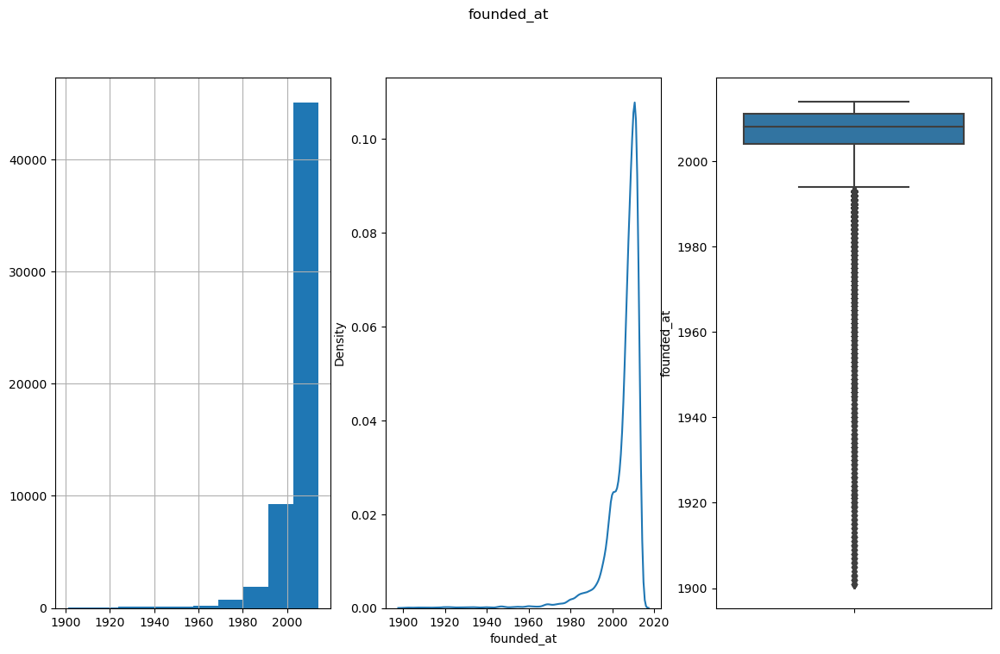

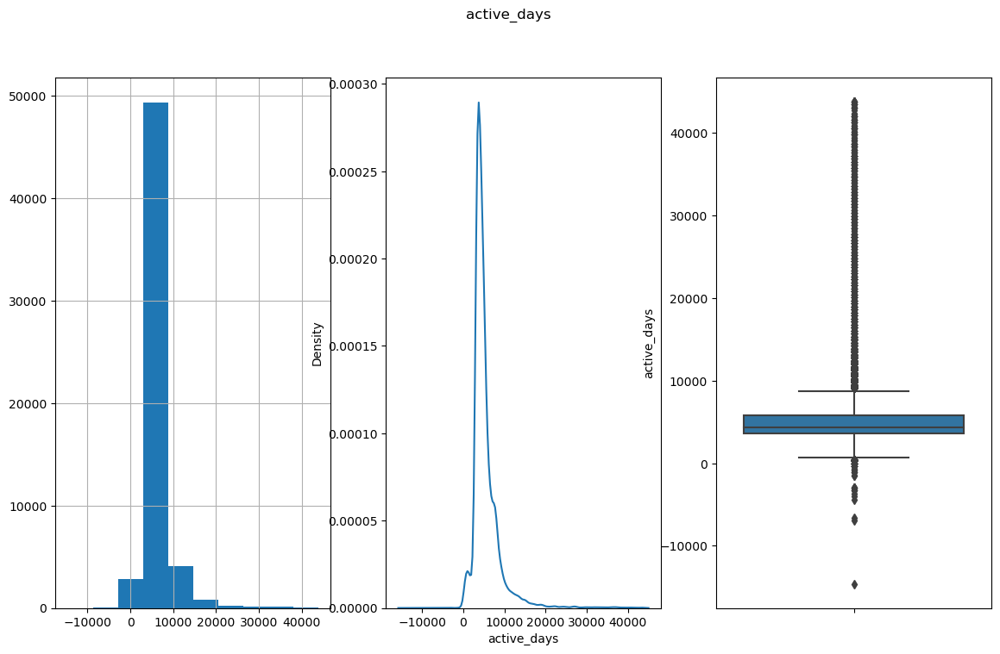

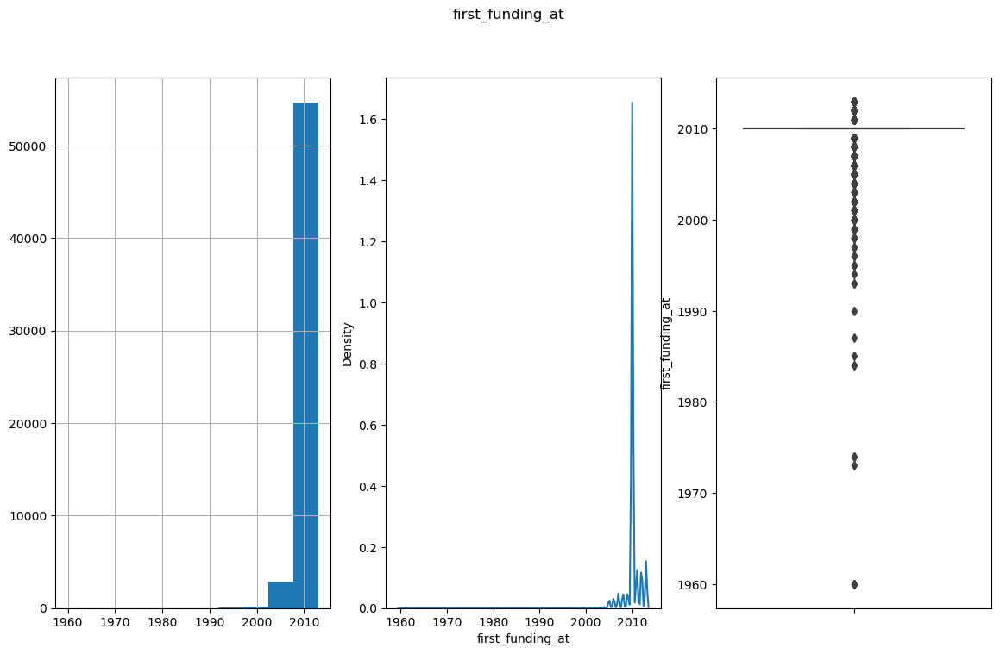

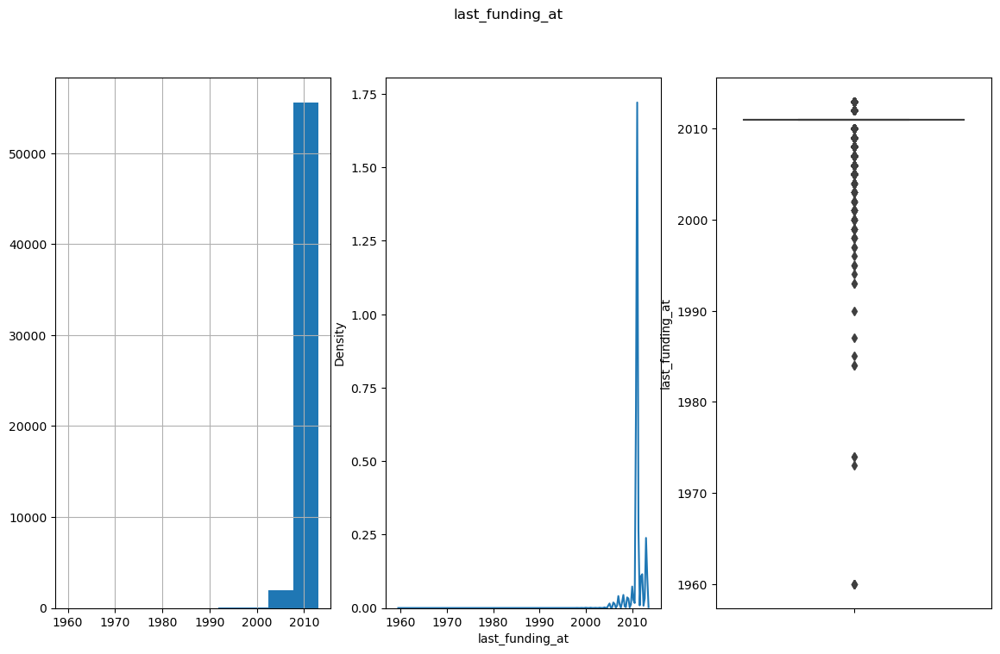

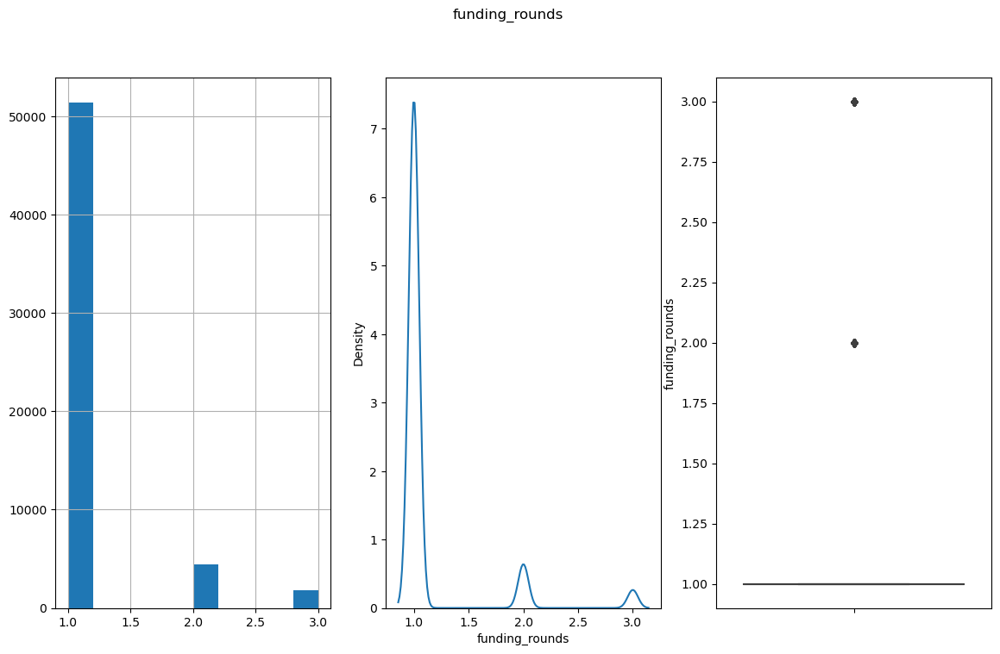

...

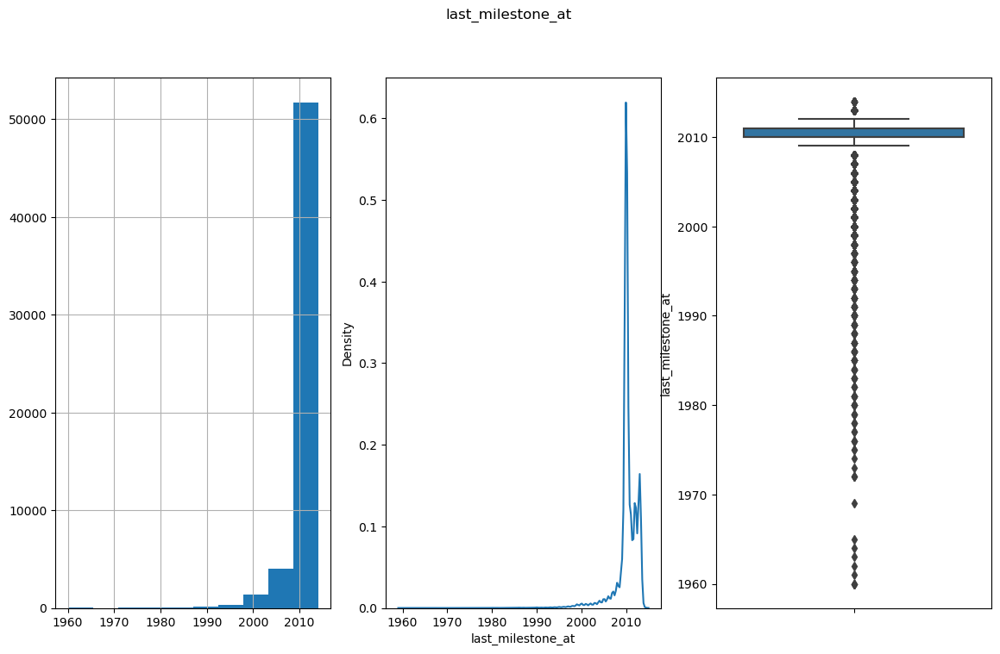

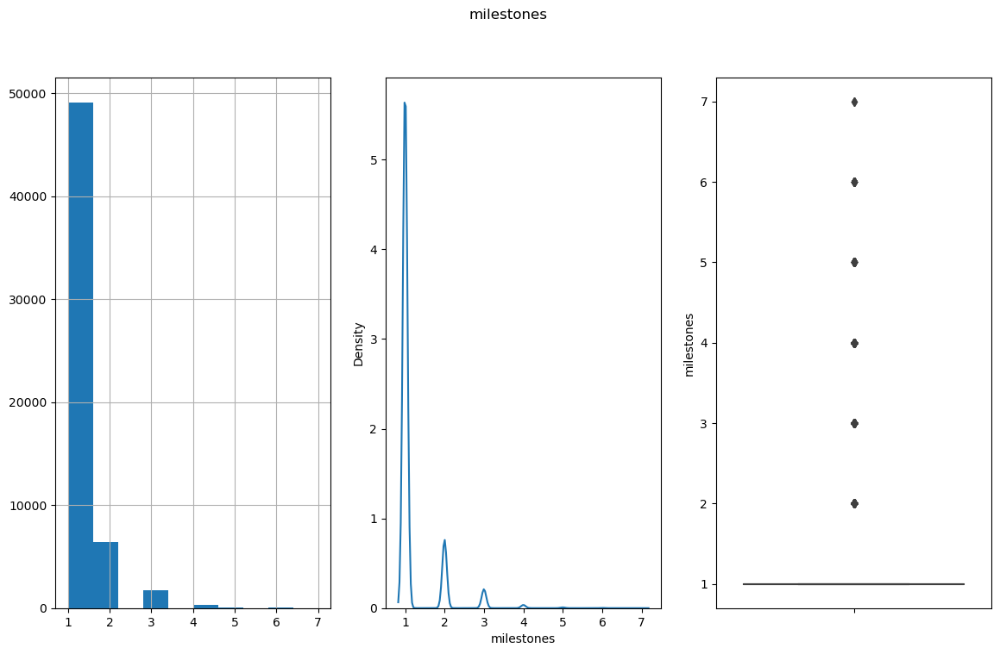

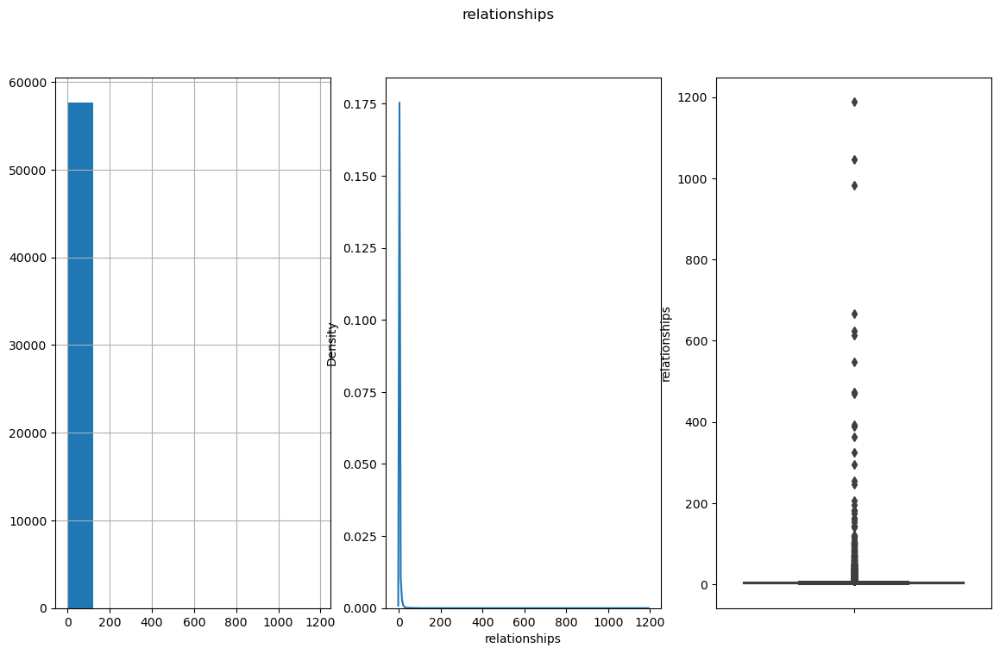

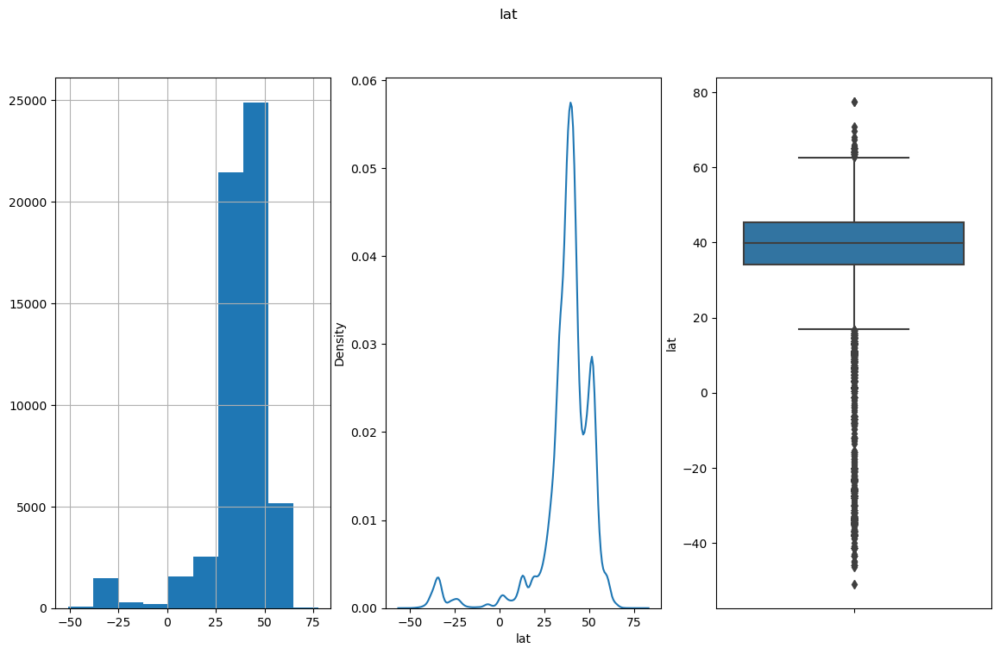

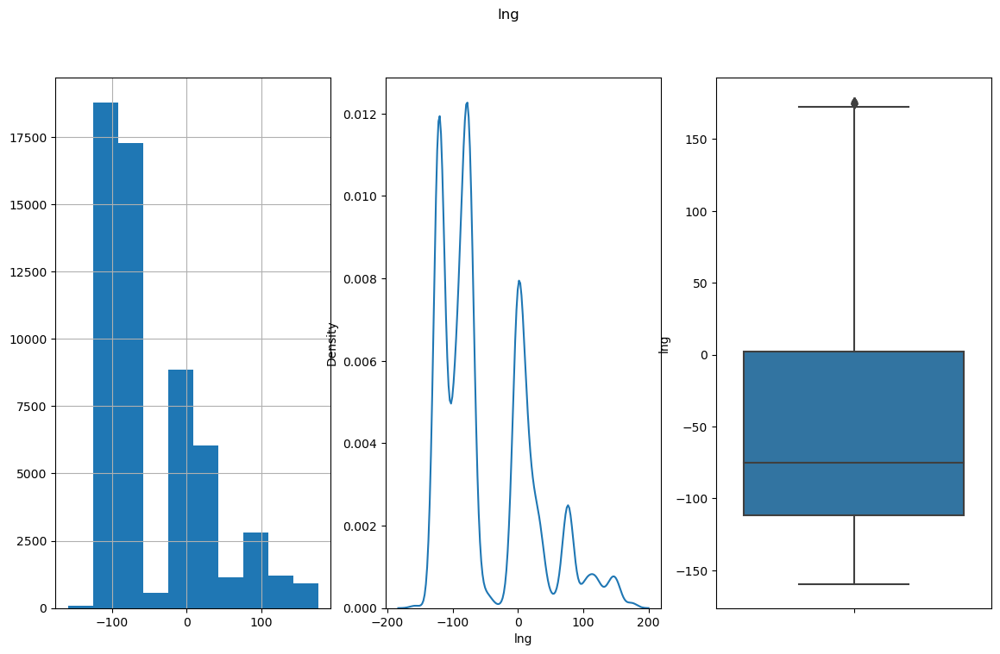

In [8]:
# Displaying histogram, kernel density plot and boxplot for each numerical feature

for col in num_feat:
    plt.figure(figsize = (14,8))
    plt.suptitle(col)
    plt.subplot(1,3,1)
    df_company[col].hist()
    plt.subplot(1,3,2)
    sns.kdeplot(df_company[col])
    plt.subplot(1,3,3)
    sns.boxplot(y = col, data = df_company)

In [12]:
# using z_score to identify outliers
z_scores = pd.DataFrame(stats.zscore(df_company[["founded_at","first_funding_at","last_funding_at","first_milestone_at","last_milestone_at","relationships","funding_total_usd","lat"]]),columns = ["founded_at","first_funding_at","last_funding_at","first_milestone_at","last_milestone_at","relationships","funding_total_usd","lat"])
abs(z_scores)

,founded_at,first_funding_at,last_funding_at,first_milestone_at,last_milestone_at,relationships,funding_total_usd,lat
0,0.024426,0.231118,0.093794,0.357055,0.220604,0.498295,0.251507,0.881706
1,0.187217,0.231118,0.093794,0.357055,0.220604,0.169792,0.251507,1.672260
2,0.187217,0.231118,0.093794,0.891237,1.365333,0.498295,0.251507,0.369712
3,0.024426,2.020667,3.123618,0.891237,0.924125,3.510227,0.464468,0.204304
4,0.187217,0.231118,0.093794,0.891237,1.365333,0.164251,0.251507,0.623636
...,...,...,...,...,...,...,...,...
57652,0.463949,0.231118,0.093794,0.357055,0.220604,0.169792,0.251507,0.123022
57653,0.024426,0.231118,0.093794,1.779671,1.496490,0.503835,0.251507,0.166446
57654,0.024426,2.020667,3.123618,1.779671,1.496490,3.510227,1.729935,0.208962
57656,0.187217,0.231118,0.093794,0.357055,0.220604,0.832338,0.251507,0.528857


In [13]:
df_company[(abs(z_scores)>3).any(axis = 1)]

,category_code,status,founded_at,active_days,country_code,first_funding_at,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,relationships,lat,lng,isClosed
3,web,acquired,2007,2192,USA,2008.0,2008.0,1.0,5000000.0,2008.0,2012.0,3.0,14.0,37.386052,-122.083851,1
6,other,operating,2003,6575,USA,2011.0,2012.0,3.0,10125293.0,2010.0,2010.0,1.0,6.0,30.267153,-97.743061,0
15,other,operating,2006,5479,USA,2011.0,2012.0,2.0,11300000.0,2009.0,2010.0,1.0,2.0,42.018989,-71.007822,0
18,games_video,operating,2006,5479,FRA,2007.0,2007.0,2.0,414840.0,2009.0,2010.0,1.0,2.0,48.856614,2.352222,0
23,web,operating,2006,5479,USA,2007.0,2007.0,1.0,2500000.0,2010.0,2012.0,2.0,7.0,37.774929,-122.419415,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57643,public_relations,acquired,2005,365,USA,2010.0,2011.0,1.0,4587548.0,2005.0,2005.0,1.0,4.0,40.037875,-76.305514,1
57644,web,operating,2007,5114,other,2008.0,2008.0,1.0,798679.0,2008.0,2008.0,3.0,2.0,13.113222,-59.598809,0
57645,mobile,closed,2008,1461,USA,2008.0,2008.0,1.0,130000.0,2008.0,2009.0,2.0,3.0,37.774929,-122.419415,1
57654,public_relations,operating,2007,5114,USA,2008.0,2008.0,1.0,750000.0,2013.0,2013.0,1.0,14.0,37.338208,-121.886329,0


In [14]:
# retrieving dataset without outliers
df_company = df_company[(abs(z_scores)<3).all(axis = 1)]

In [15]:
# Deleting negative values in active_days
df_company = df_company[df_company["active_days"]>0]

In [16]:
df_company

,category_code,status,founded_at,active_days,country_code,first_funding_at,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,relationships,lat,lng,isClosed
0,advertising,operating,2007,5114,other,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,2.0,30.427755,-9.598107,0
1,other,operating,2008,4749,IND,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,4.0,22.307159,73.181219,0
2,advertising,operating,2008,4749,USA,2010.0,2011.0,1.0,4587548.0,2008.0,2008.0,1.0,2.0,35.686975,-105.937799,0
4,games_video,operating,2008,4749,USA,2010.0,2011.0,1.0,4587548.0,2008.0,2008.0,1.0,3.0,33.078655,-116.601964,0
7,software,operating,2011,3653,AUS,2010.0,2011.0,1.0,4587548.0,2011.0,2011.0,1.0,2.0,49.050438,-122.304470,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57650,web,operating,2006,5479,other,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,4.0,35.185566,33.382276,0
57651,other,operating,2008,4749,USA,2010.0,2011.0,1.0,4587548.0,2011.0,2011.0,1.0,5.0,38.846224,-77.306373,0
57652,software,operating,2004,6210,USA,2010.0,2011.0,1.0,4587548.0,2009.0,2010.0,1.0,4.0,40.748350,-74.323219,0
57653,ecommerce,operating,2007,5114,USA,2010.0,2011.0,1.0,4587548.0,2013.0,2013.0,2.0,5.0,37.774929,-122.419415,0


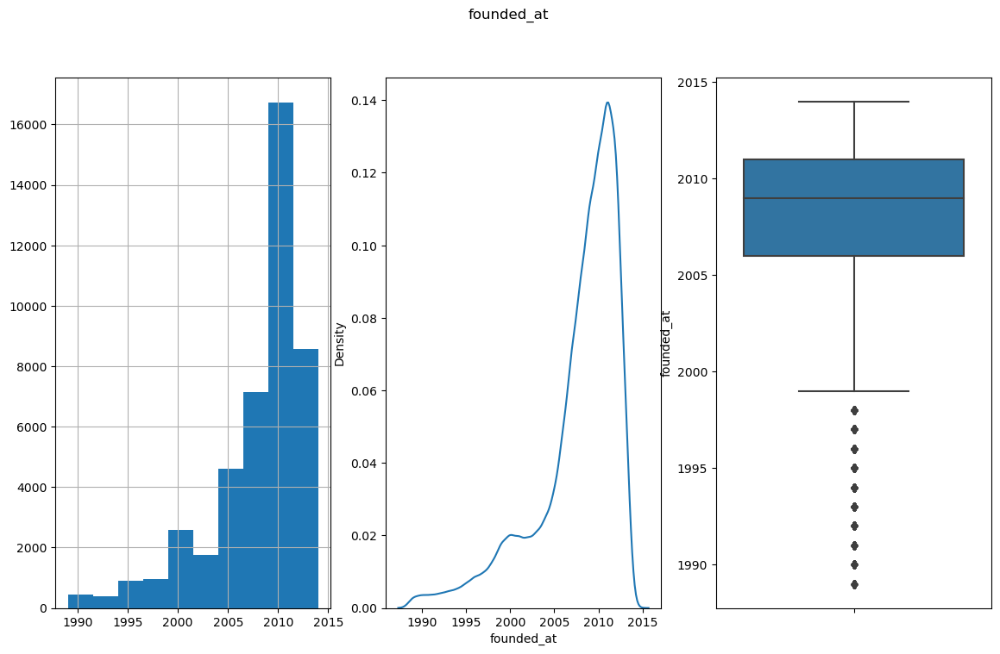

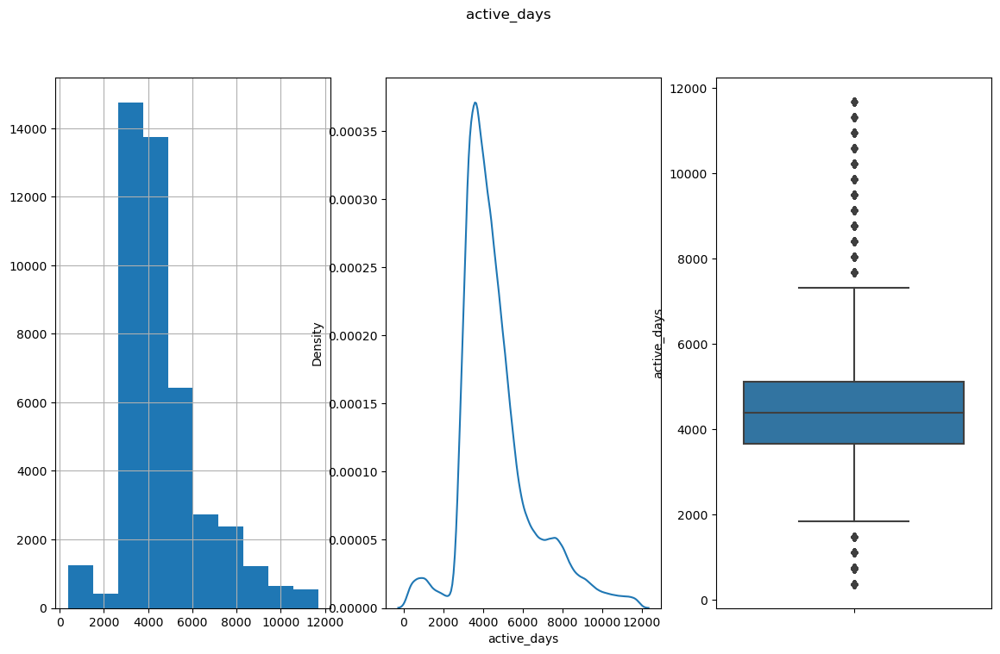

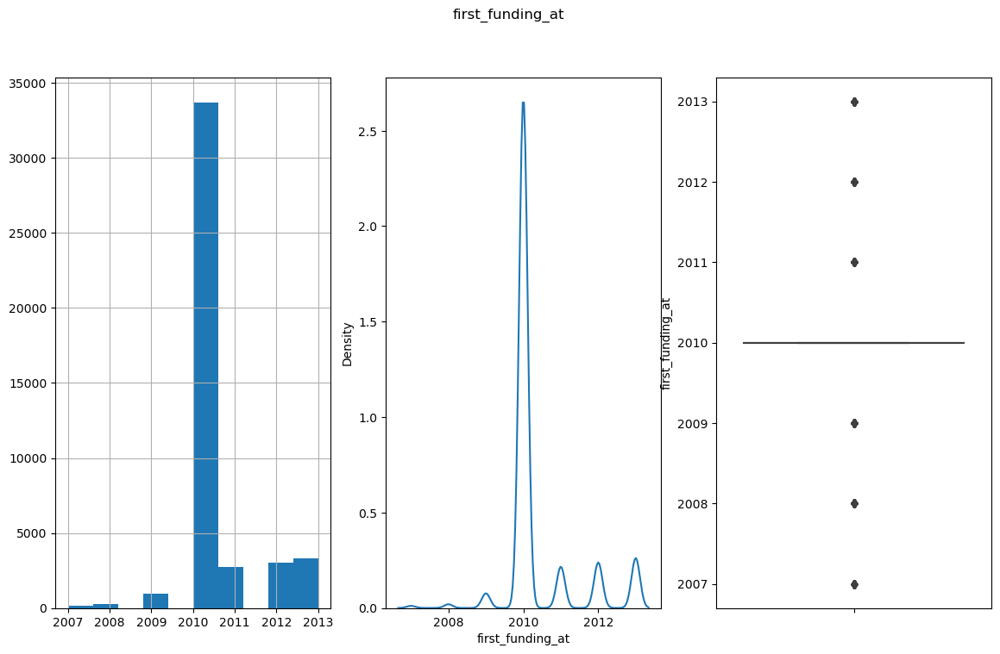

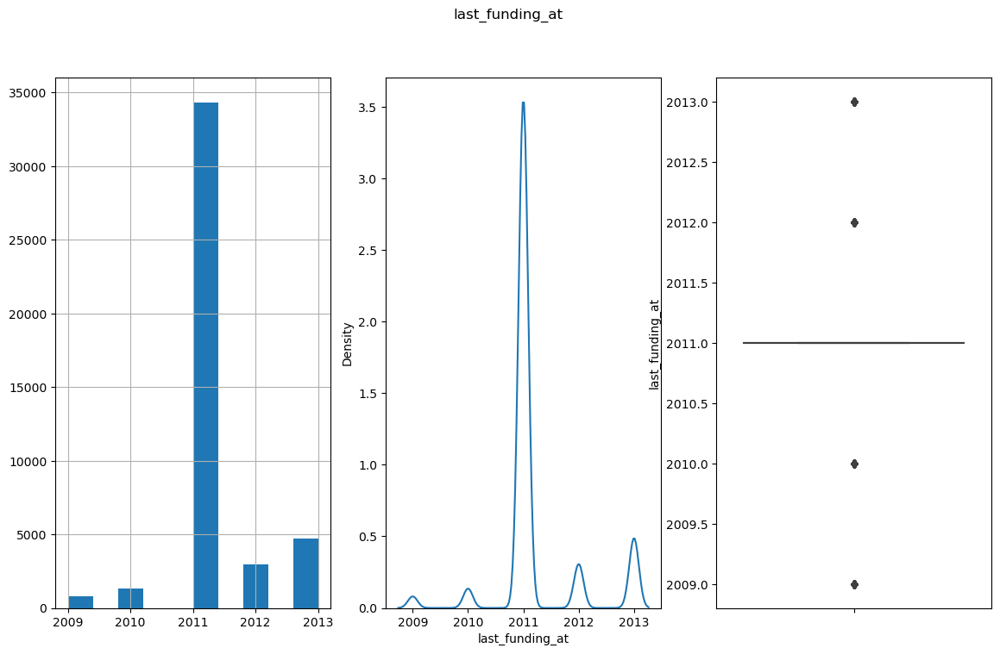

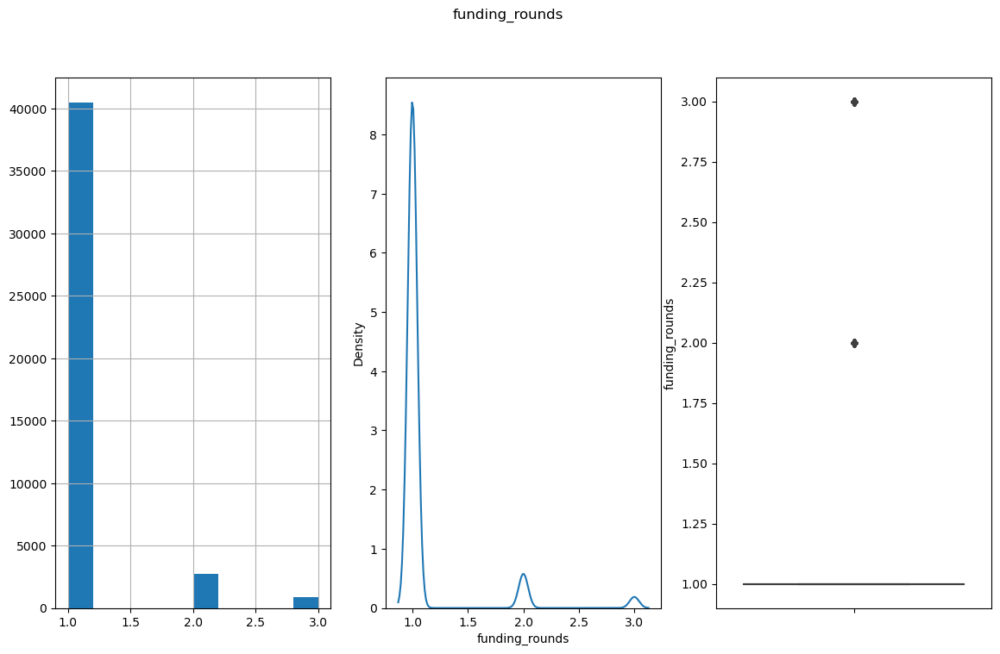

...

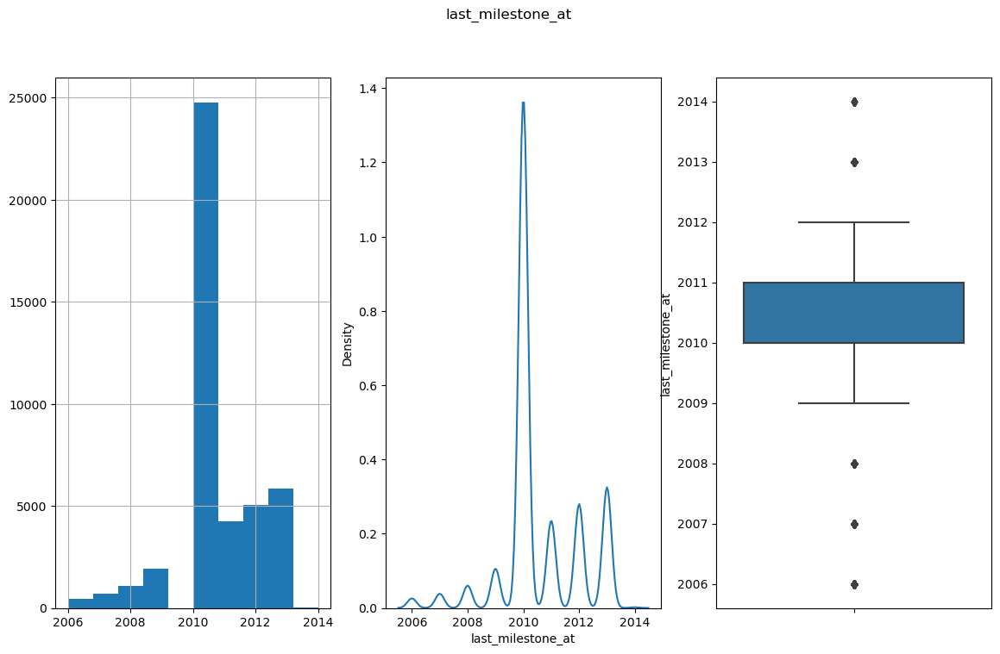

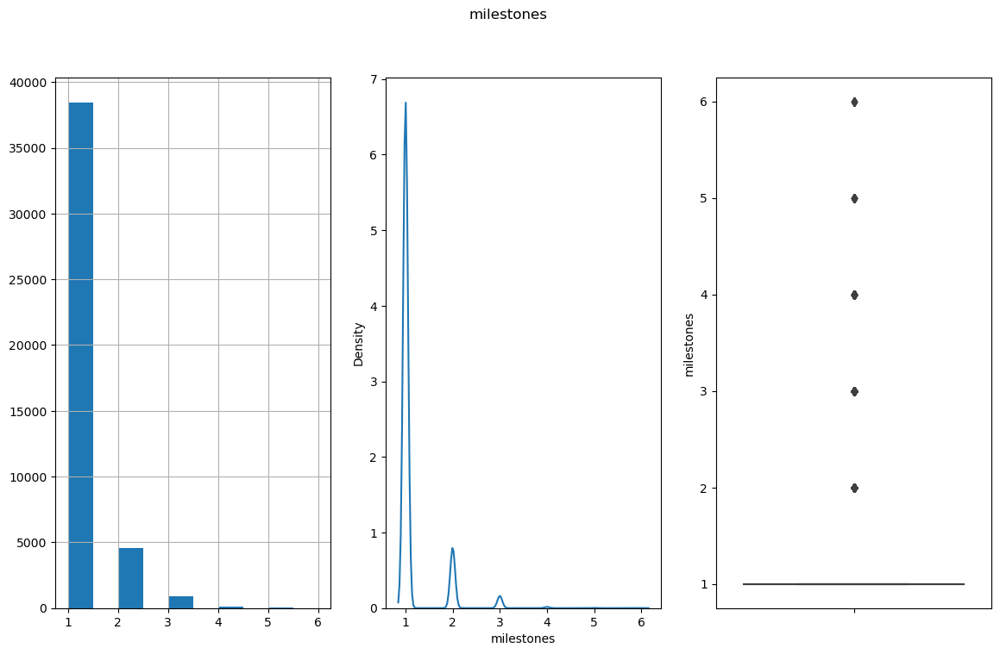

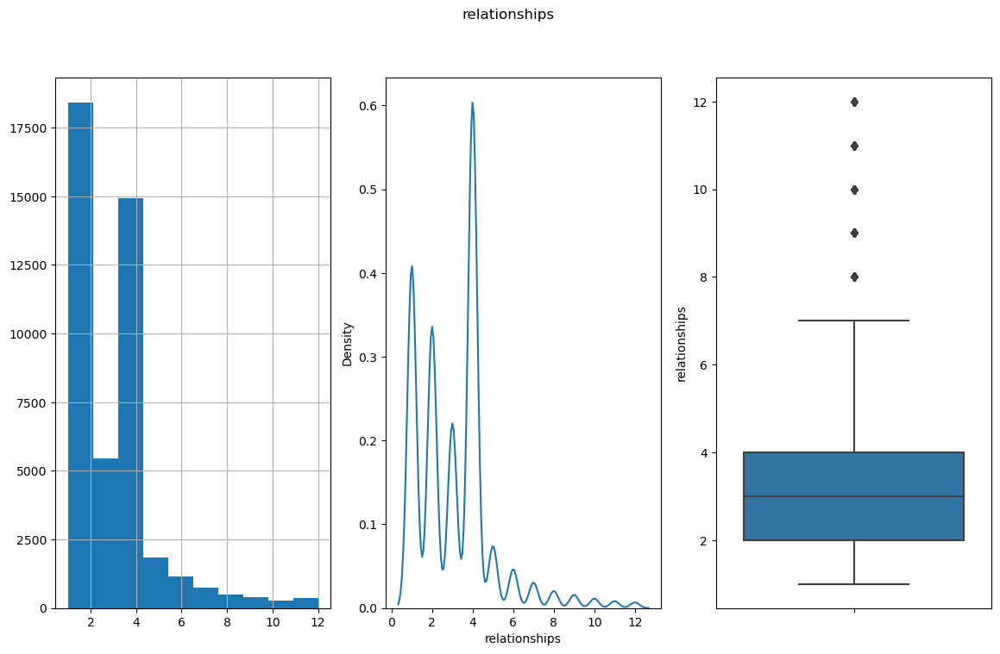

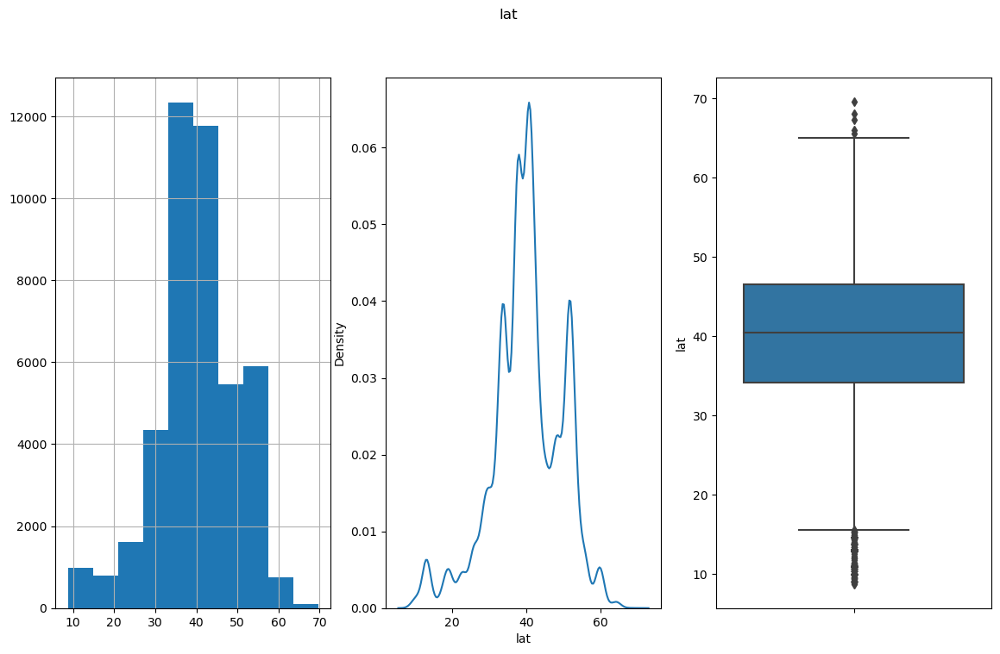

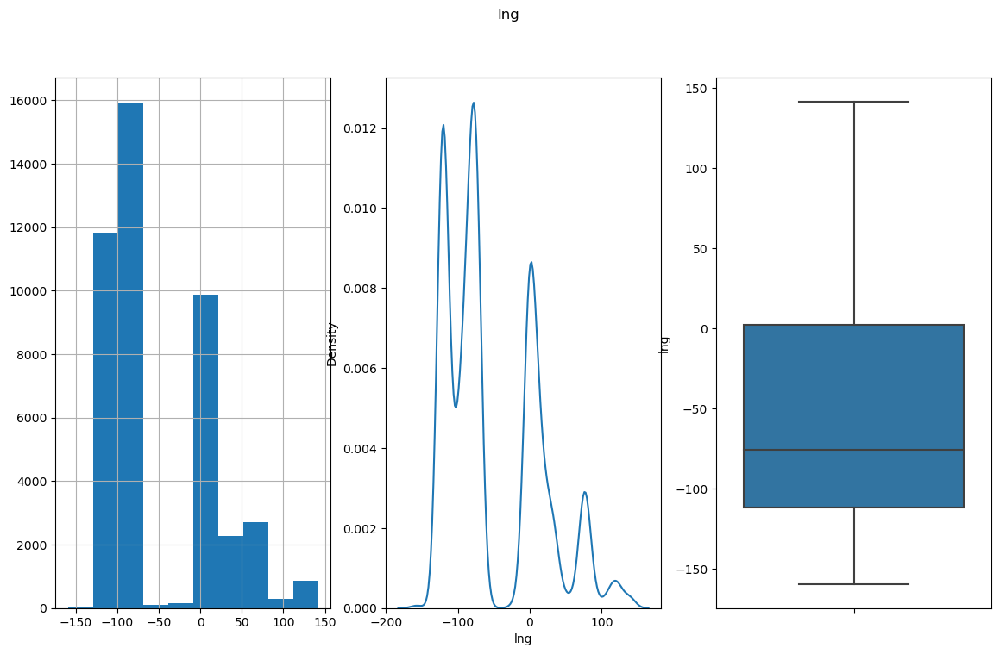

In [17]:
# Displaying histogram, kernel density plot and boxplot for each numerical feature

for col in num_feat:
    plt.figure(figsize = (14,8))
    plt.suptitle(col)
    plt.subplot(1,3,1)
    df_company[col].hist()
    plt.subplot(1,3,2)
    sns.kdeplot(df_company[col])
    plt.subplot(1,3,3)
    sns.boxplot(y = col, data = df_company)

## 1) b) Univariate analysis/Categorical features

#### Category code

<Axes: xlabel='category_code', ylabel='count'>

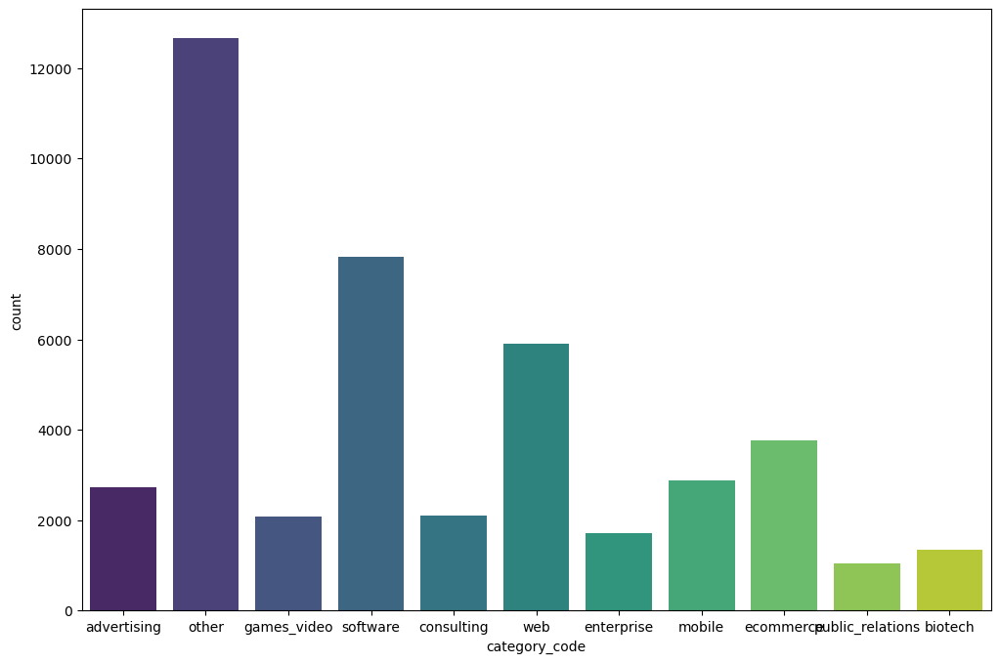

In [27]:
plt.figure(figsize = (12,8))
sns.countplot(data = df_company, x = "category_code", palette = "viridis")

#### Country code

<Axes: xlabel='country_code', ylabel='count'>

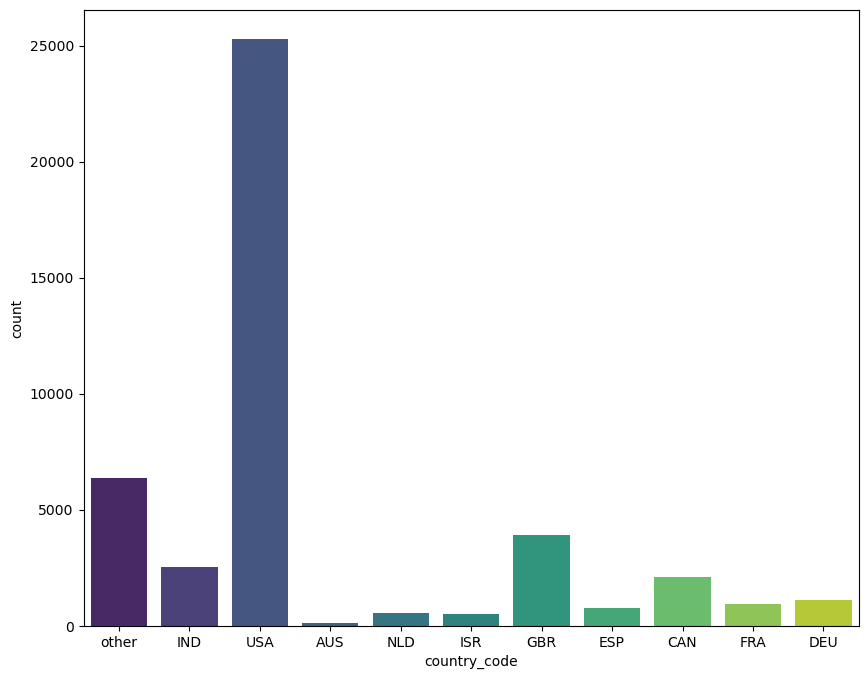

In [30]:
plt.figure(figsize = (10,8))
sns.countplot(data = df_company, x = "country_code", palette = "viridis")

#### IsClosed

In [31]:
df_company.isClosed.value_counts()

isClosed
0    41493
1     2585
Name: count, dtype: int64

<Axes: xlabel='isClosed'>

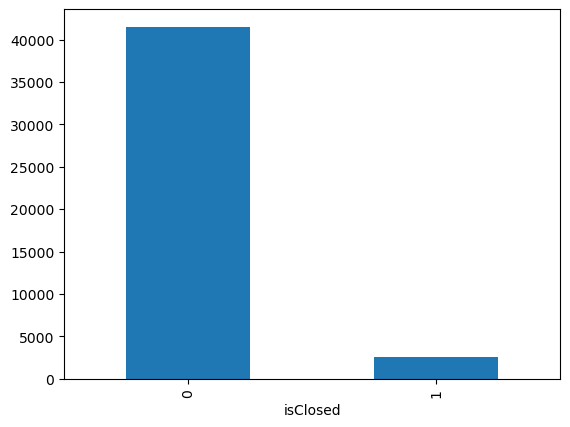

In [32]:
df_company.isClosed.value_counts().plot(kind = 'bar')

## 2) a) Bivariate analysis/Numerical - Numerical relationships

C:\Users\HP\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x1000 with 0 Axes>

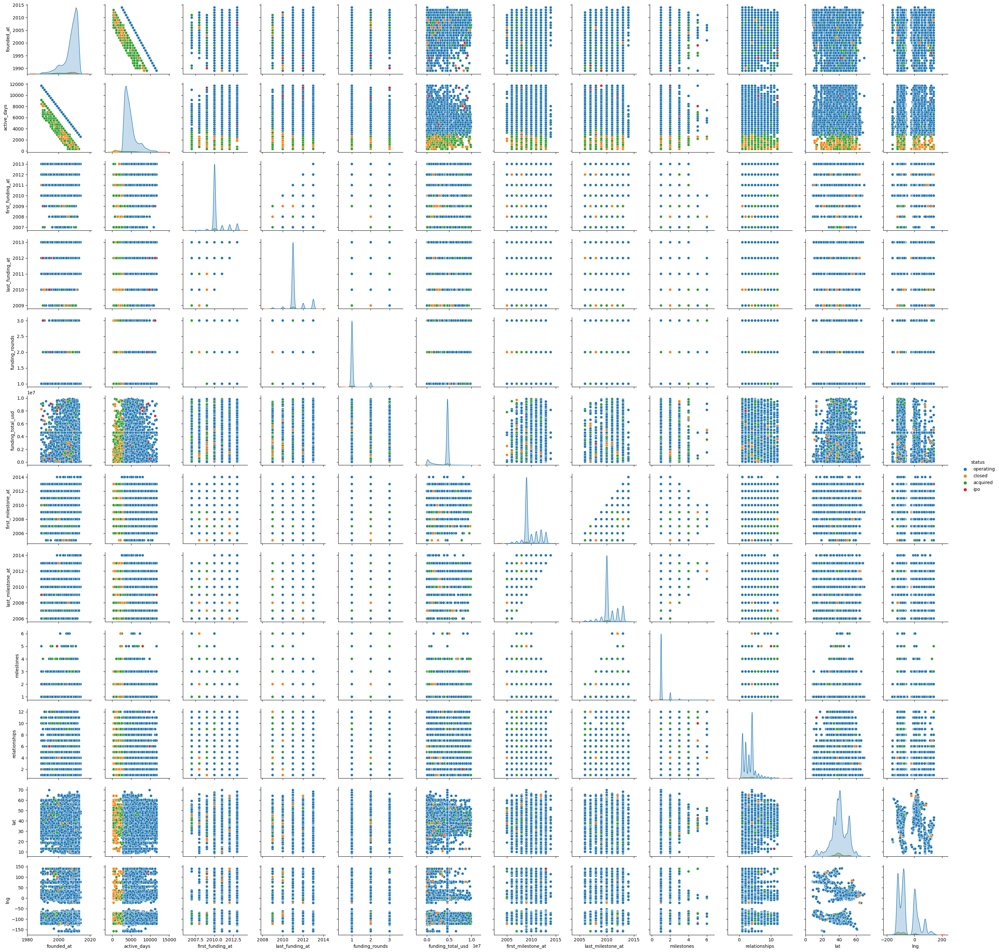

In [33]:
plt.figure(figsize = (12,10))
sns.pairplot(df_company[num_feat+["status"]], hue = "status")

<Axes: >

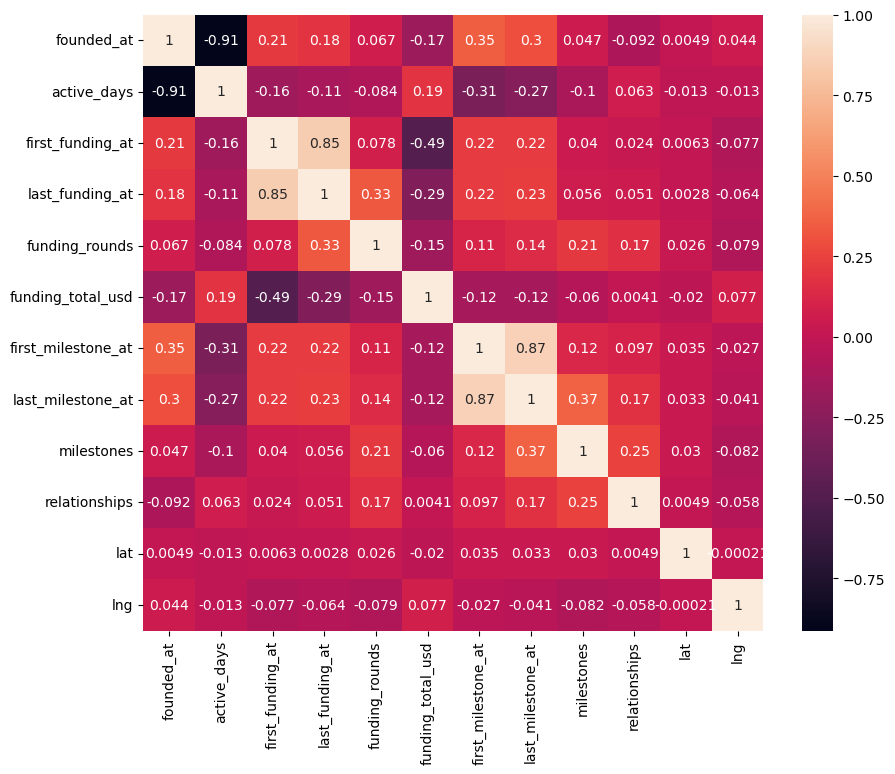

In [37]:
# Pearson correlation matrix for numerical features
plt.figure(figsize = (10,8))
sns.heatmap(df_company[num_feat].corr(method = "pearson"), annot = True)

<Axes: >

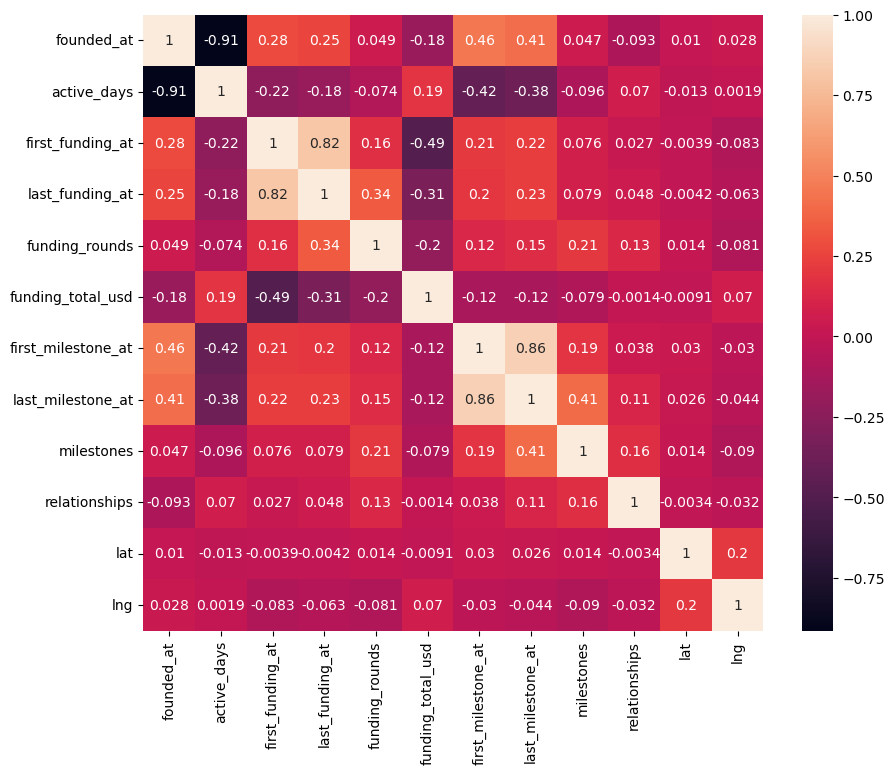

In [38]:
# Spearman correlation matrix for numerical features
plt.figure(figsize = (10,8))
sns.heatmap(df_company[num_feat].corr(method = "spearman"), annot = True)

## 2) a) Bivariate analysis/Categorical - Categorical relationships

In [45]:
# Contingency table with stacked bar plots for category code and country code
pd.crosstab(df_company["category_code"],df_company["country_code"])

country_code,AUS,CAN,DEU,ESP,FRA,GBR,IND,ISR,NLD,USA,other
category_code,,,,,,,,,,,
advertising,10,139,55,35,56,256,126,55,34,1606,362
biotech,1,46,29,8,23,53,18,21,5,1056,84
consulting,7,95,38,40,43,203,161,10,21,1211,282
ecommerce,7,136,130,104,89,379,351,35,51,1827,654
enterprise,4,96,36,20,47,138,72,23,26,1022,236
games_video,5,107,70,44,51,169,59,35,30,1139,376
mobile,3,147,105,53,65,247,83,57,41,1604,486
other,42,533,295,223,210,1161,691,127,148,7540,1698
public_relations,0,64,25,20,22,123,36,11,27,564,153


<Axes: xlabel='category_code'>

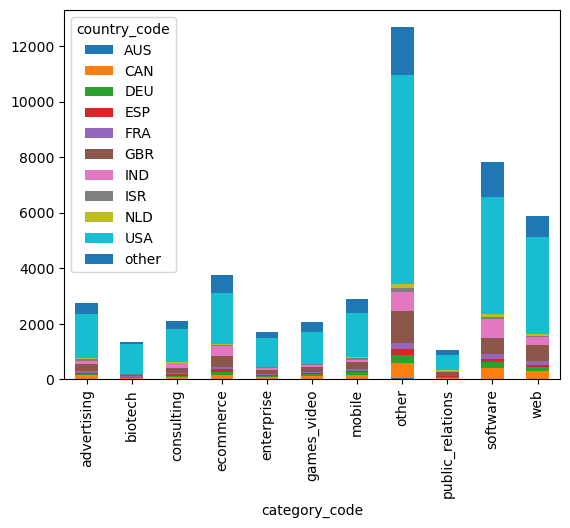

In [42]:
# Visualization of contingency table with stacked bar plots for category code and country code
pd.crosstab(df_company["category_code"],df_company["country_code"]).plot(kind = "bar", stacked = True)

In [46]:
# Contingency table with stacked bar plots for category code and isClosed
pd.crosstab(df_company["category_code"],df_company["isClosed"])

isClosed,0,1
category_code,,
advertising,2589,145
biotech,1223,121
consulting,2067,44
ecommerce,3601,162
enterprise,1585,135
games_video,1928,157
mobile,2696,195
other,12066,602
public_relations,980,65


<Axes: xlabel='category_code'>

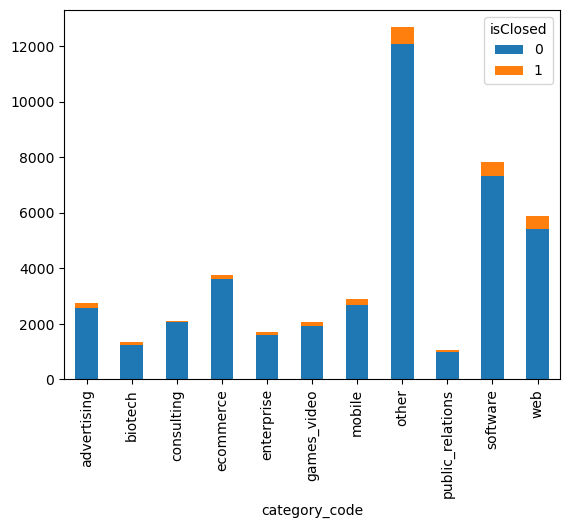

In [43]:
# Visualization of contingency table with stacked bar plots for category code and isClosed
pd.crosstab(df_company["category_code"],df_company["isClosed"]).plot(kind = "bar", stacked = True)

In [47]:
# Contingency table with stacked bar plots for country code and isClosed
pd.crosstab(df_company["country_code"],df_company["isClosed"])

isClosed,0,1
country_code,,
AUS,105,3
CAN,1973,108
DEU,1040,63
ESP,722,20
FRA,882,39
GBR,3692,206
IND,2514,31
ISR,483,27
NLD,525,16


<Axes: xlabel='country_code'>

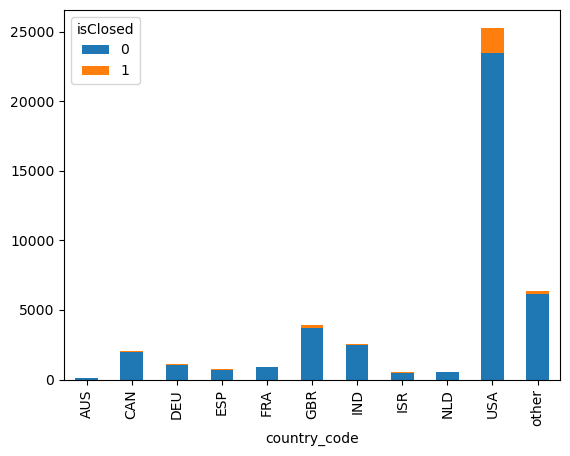

In [44]:
# Visualization of contingency table with stacked bar plots for country code and isClosed
pd.crosstab(df_company["country_code"],df_company["isClosed"]).plot(kind = "bar", stacked = True)

#### 2) c) Bivariate analysis/Categorical - Numerical relationships

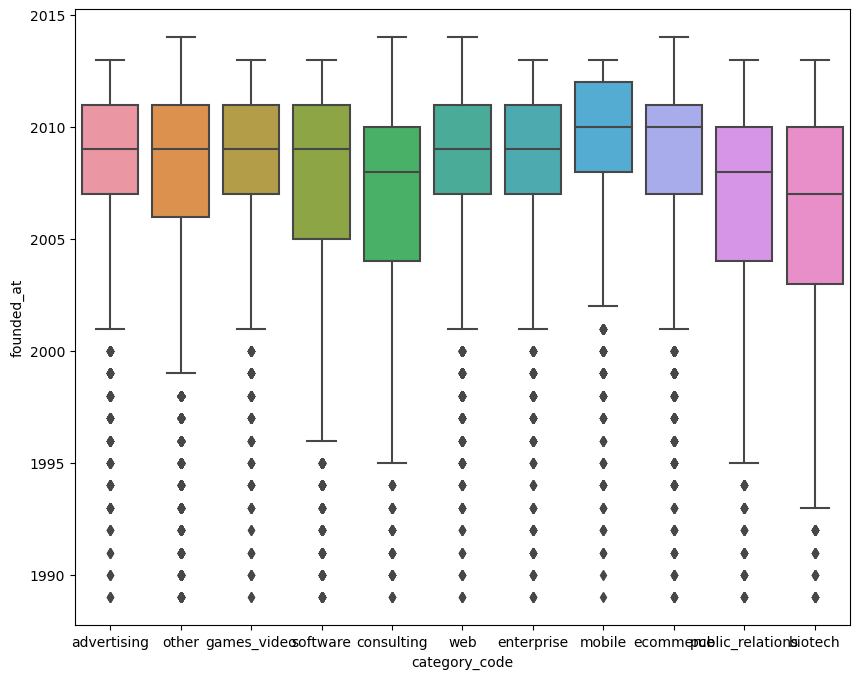

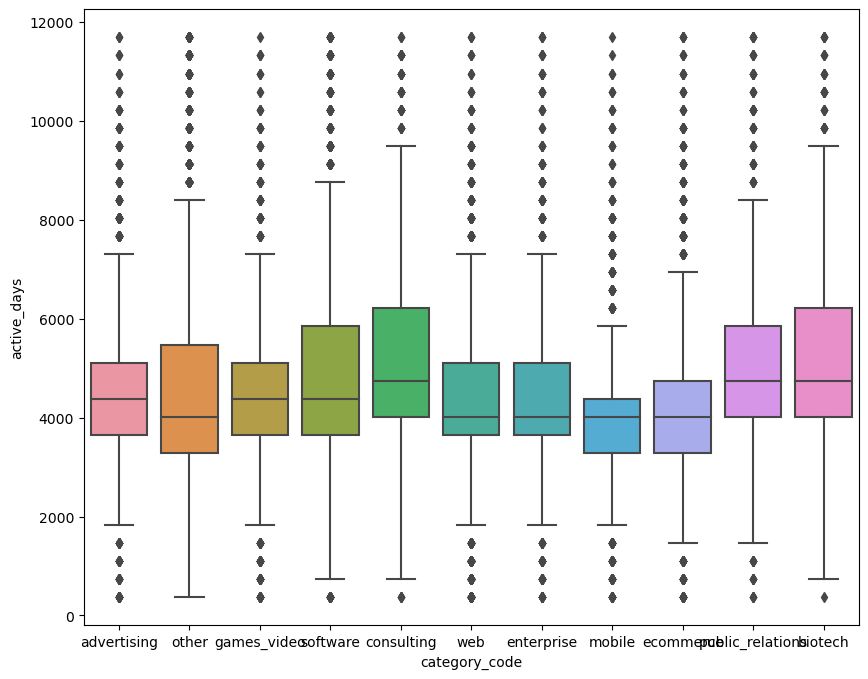

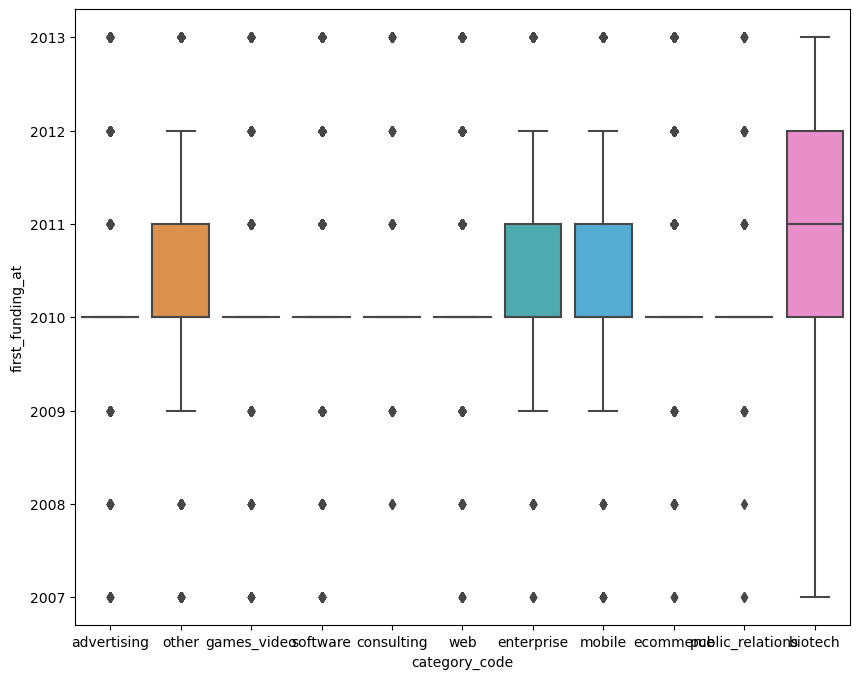

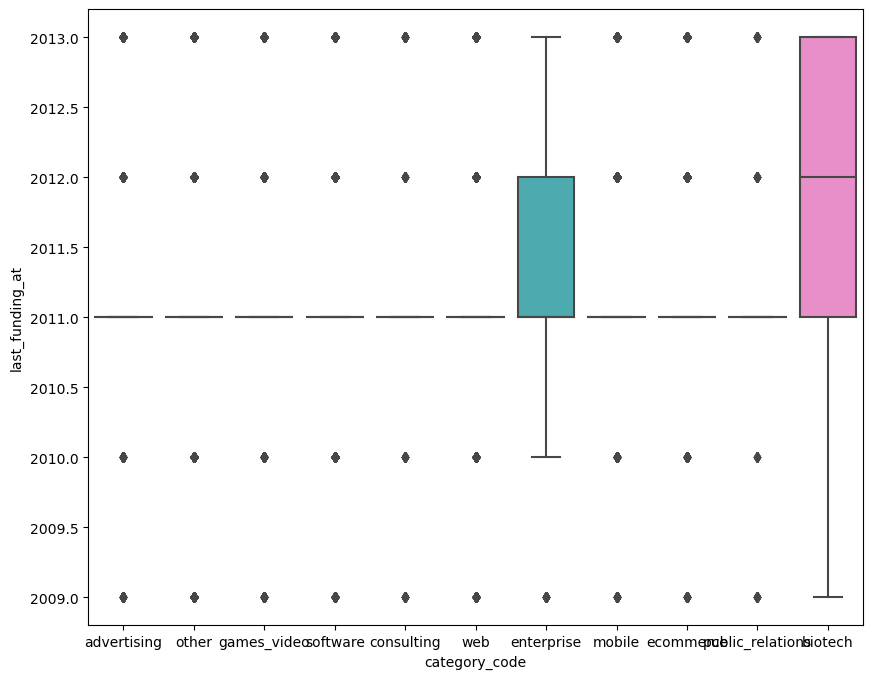

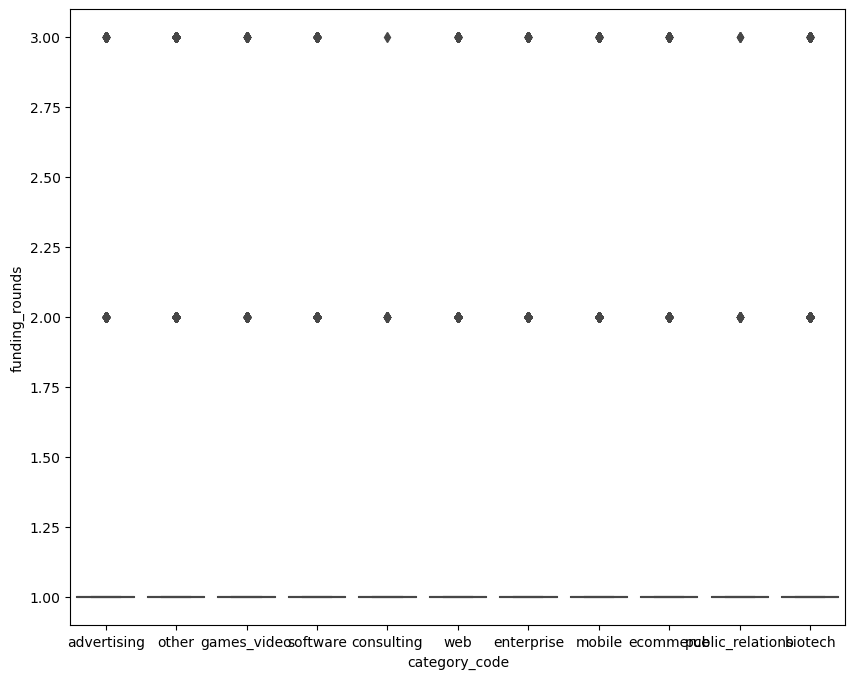

...

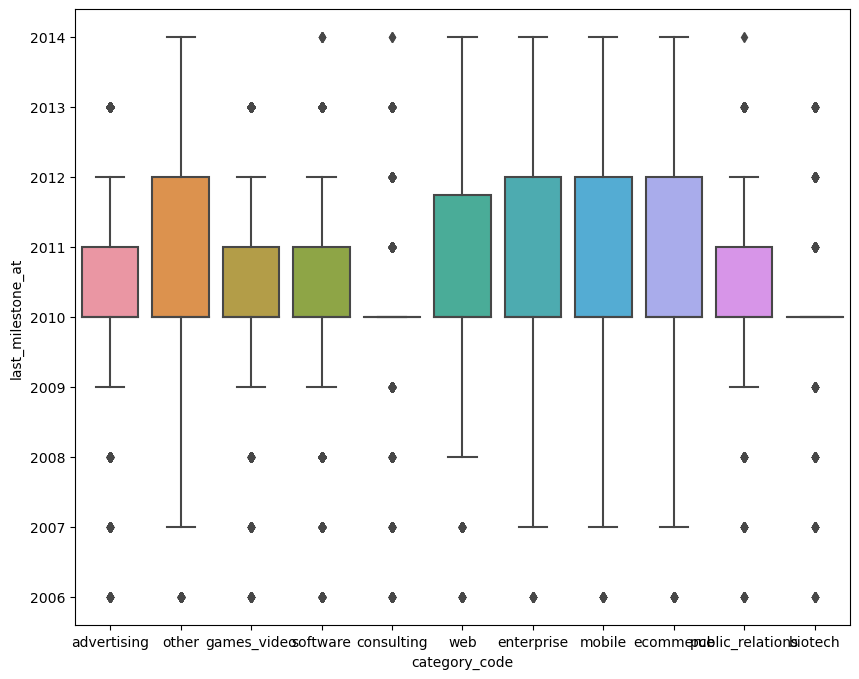

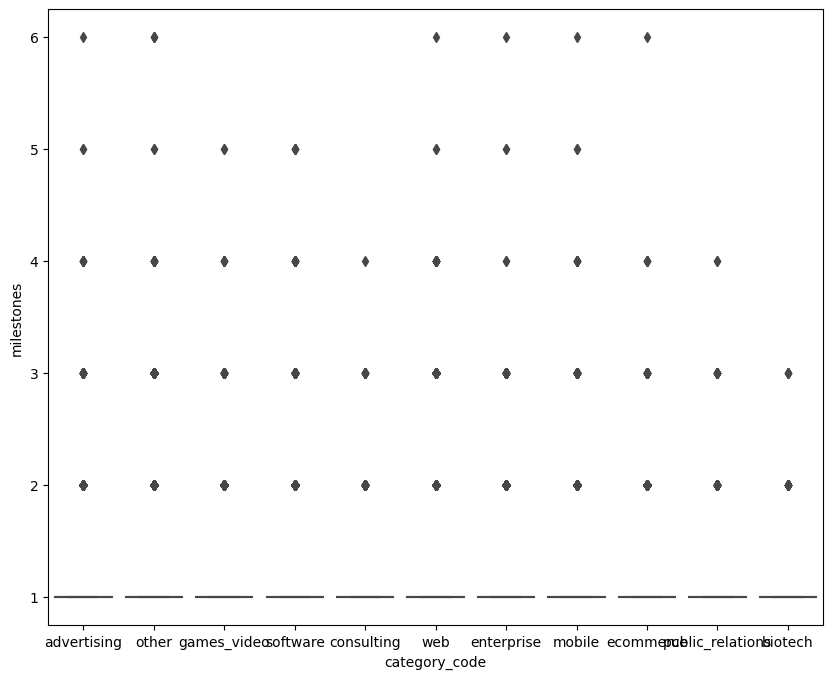

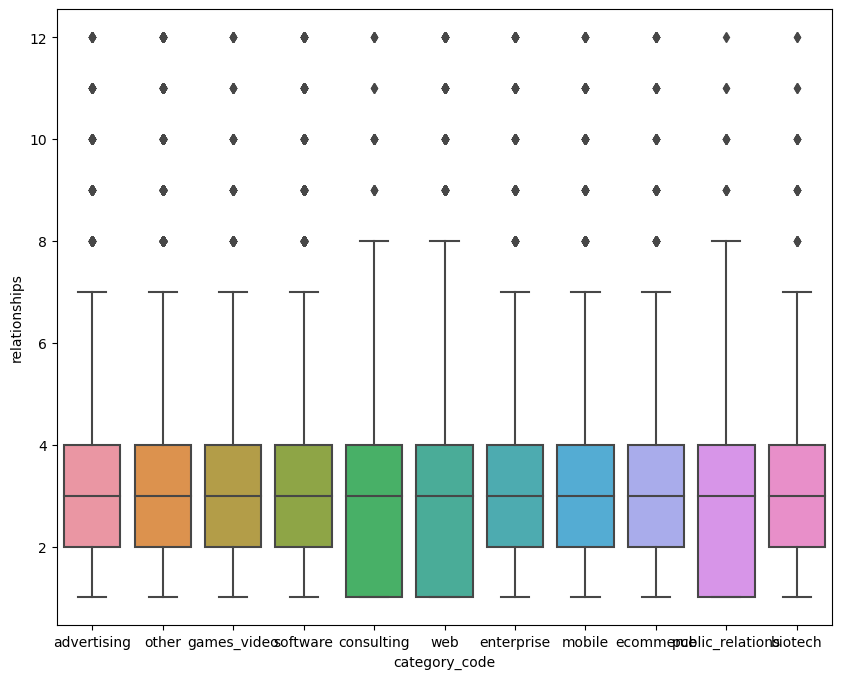

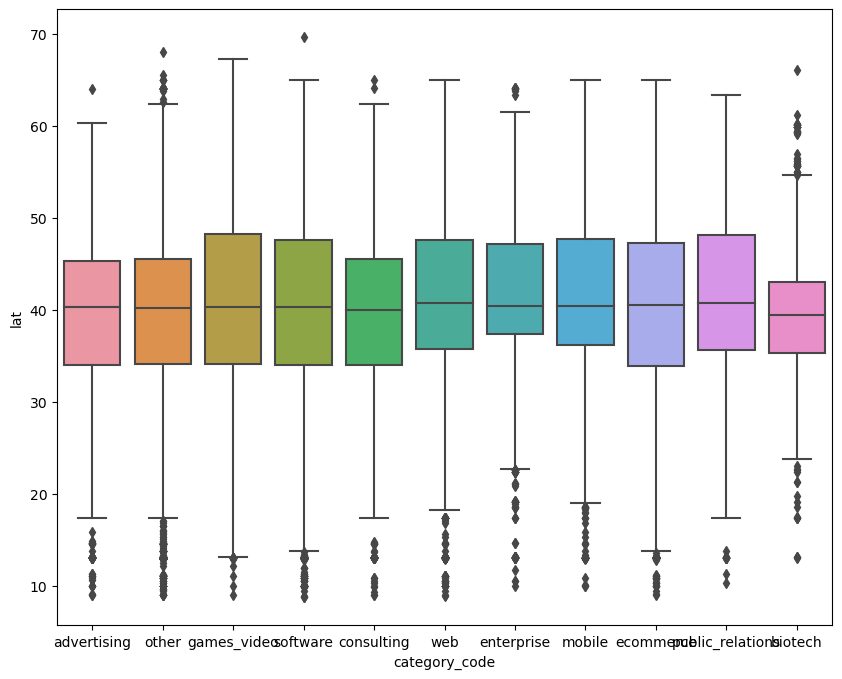

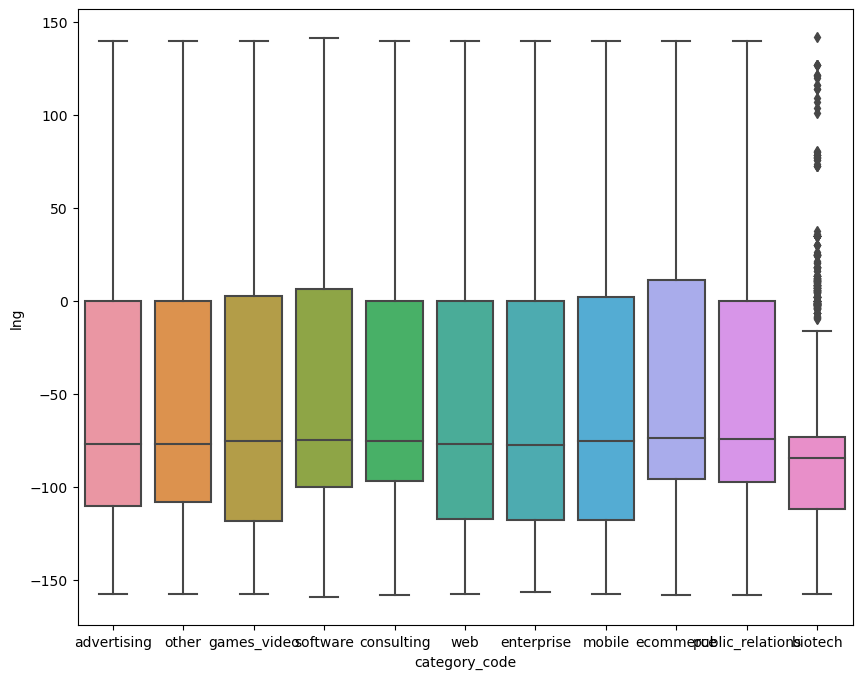

In [50]:
# Category code with numerical features
for col in num_feat:
    plt.figure(figsize = (10,8))
    sns.boxplot(data = df_company, x = "category_code", y = col)

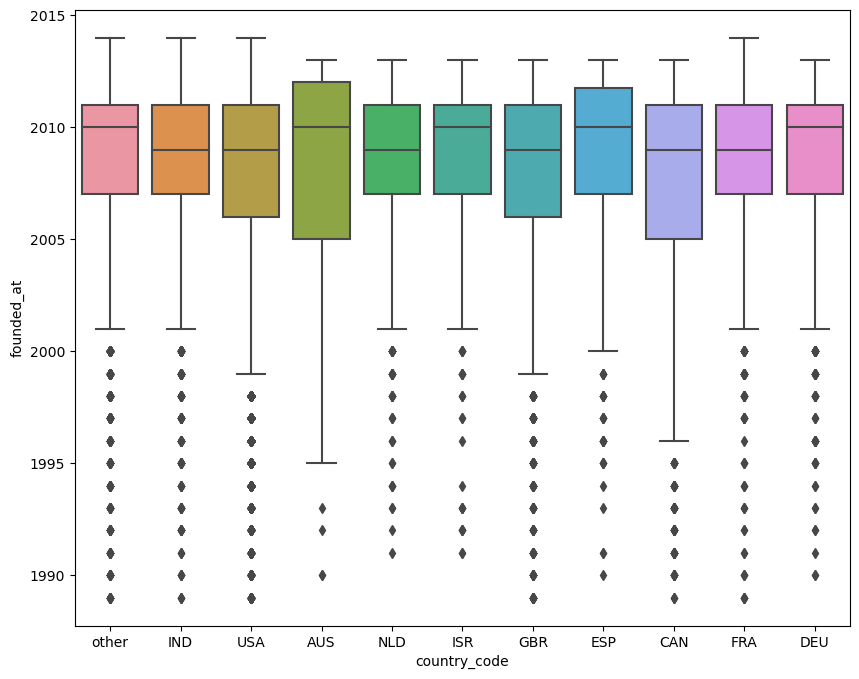

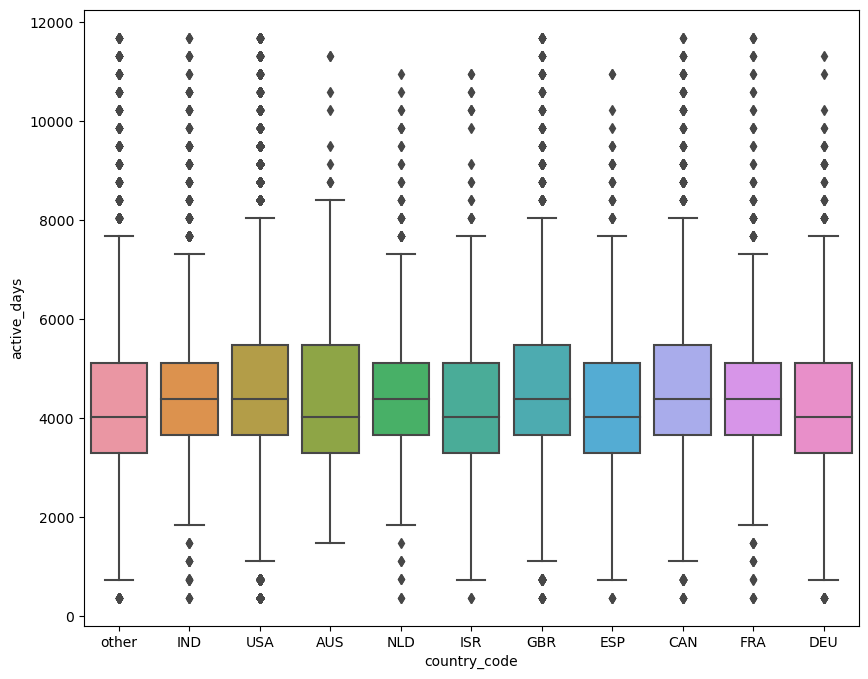

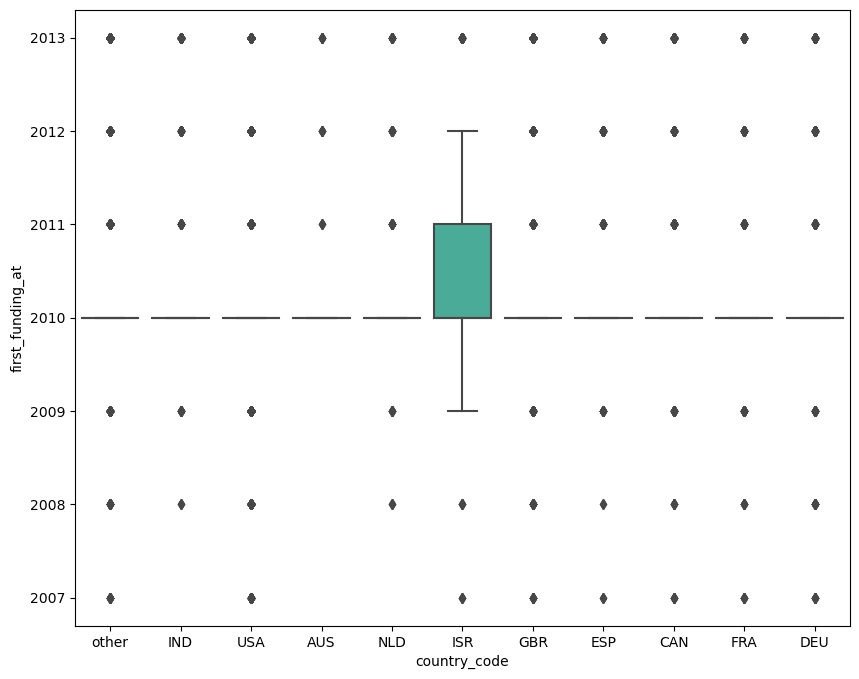

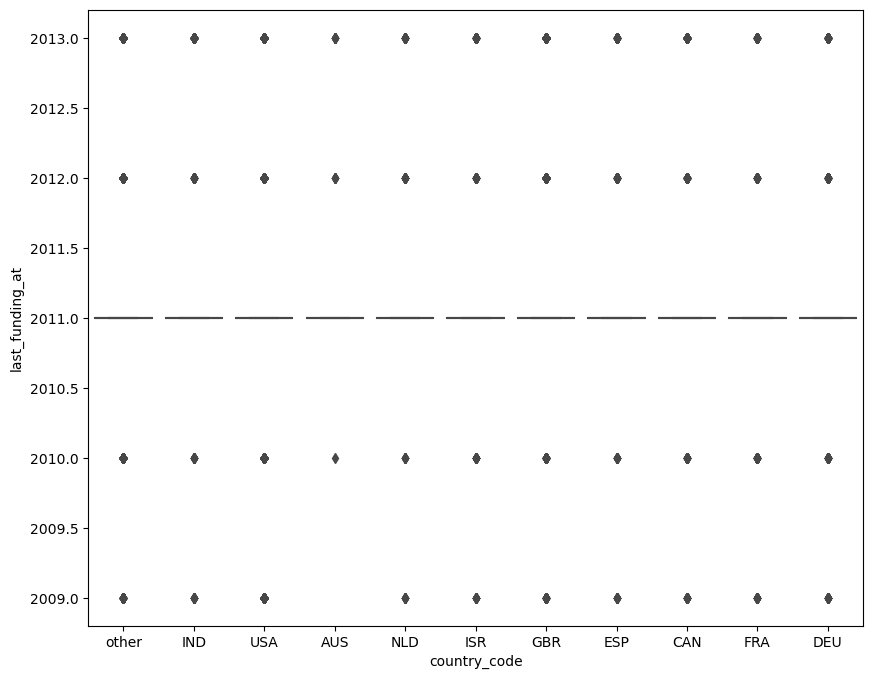

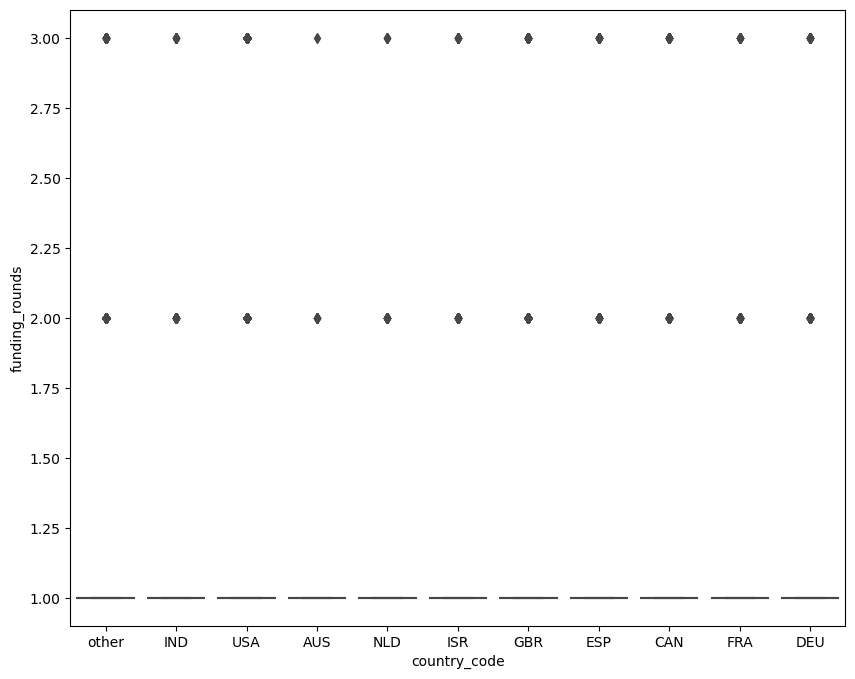

...

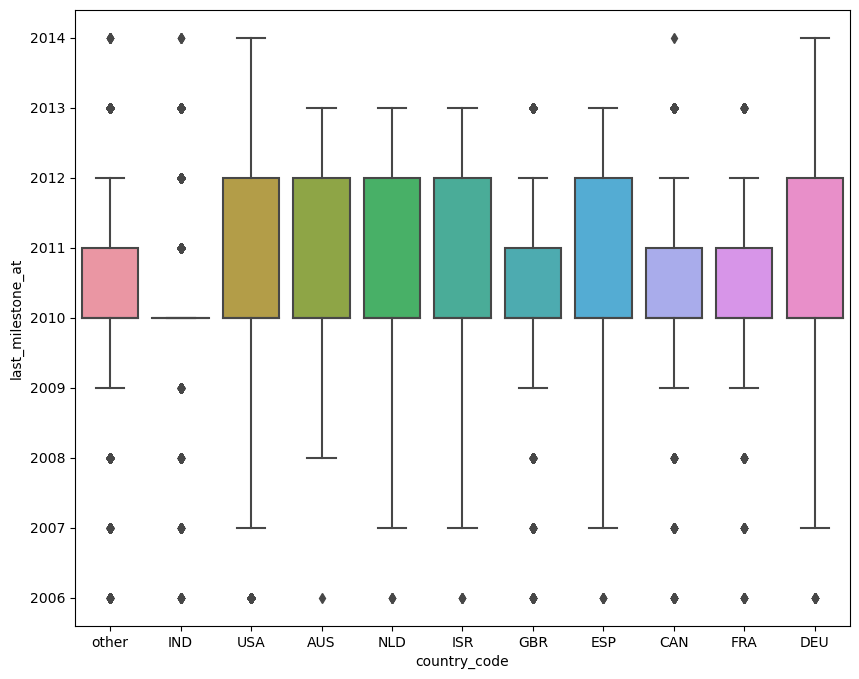

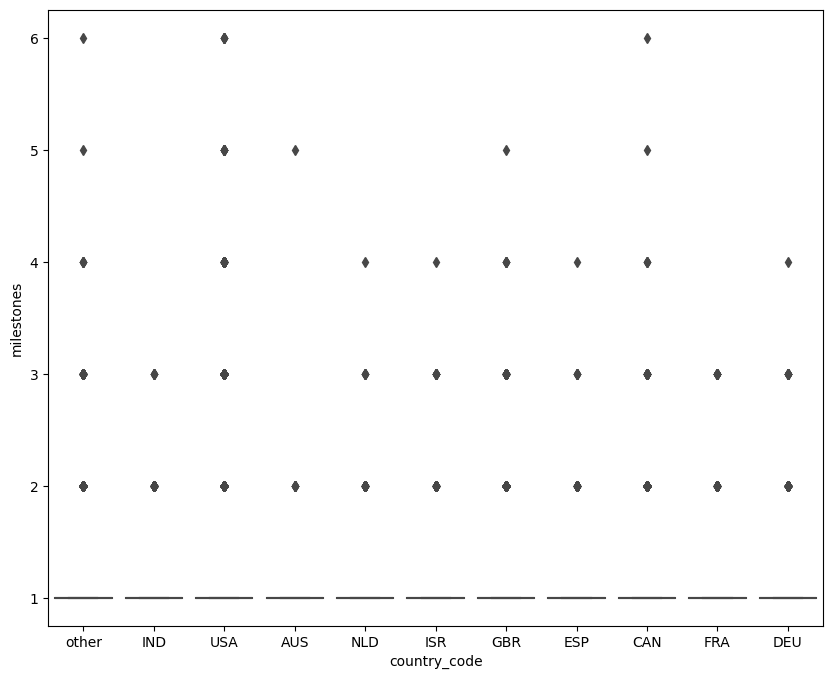

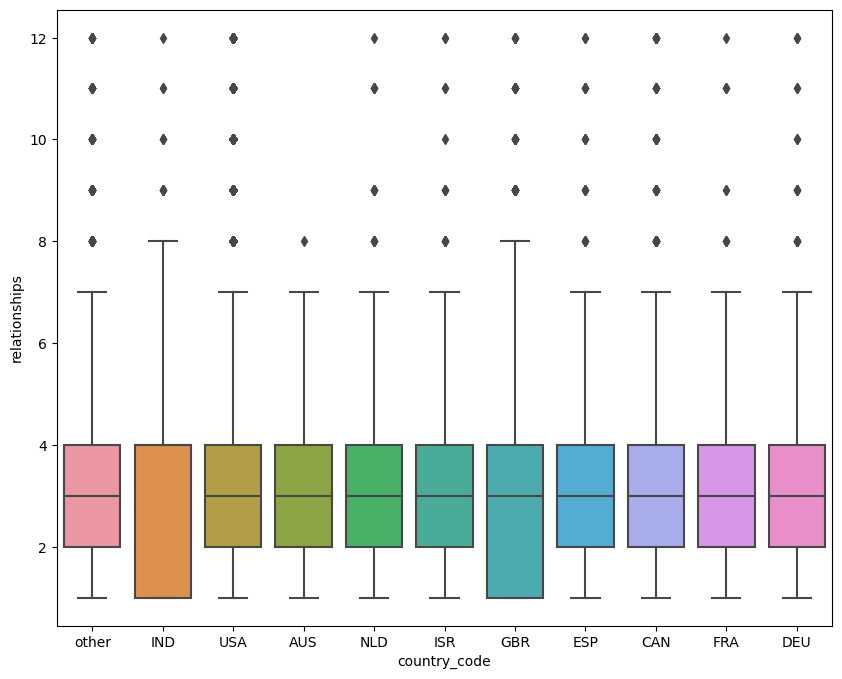

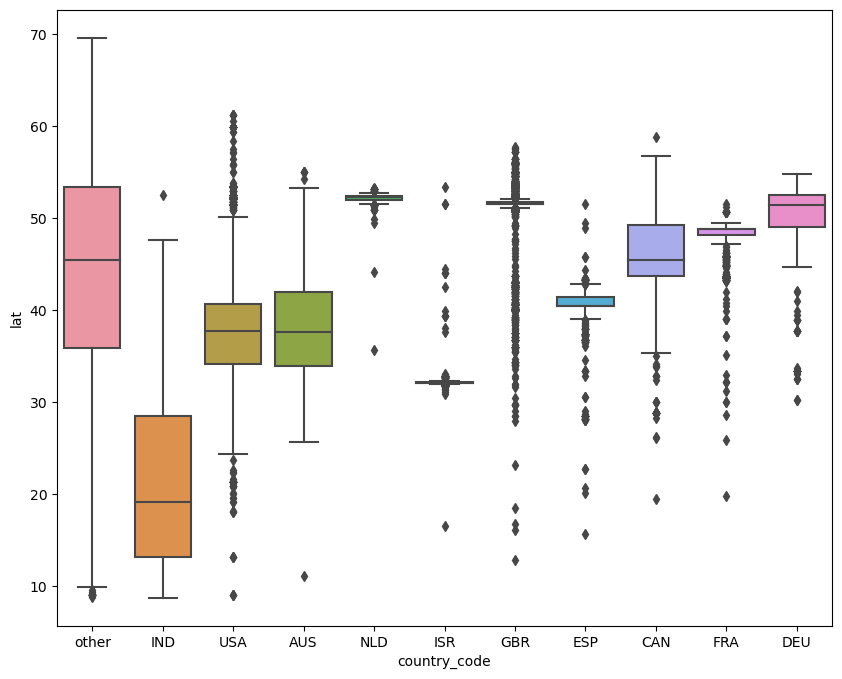

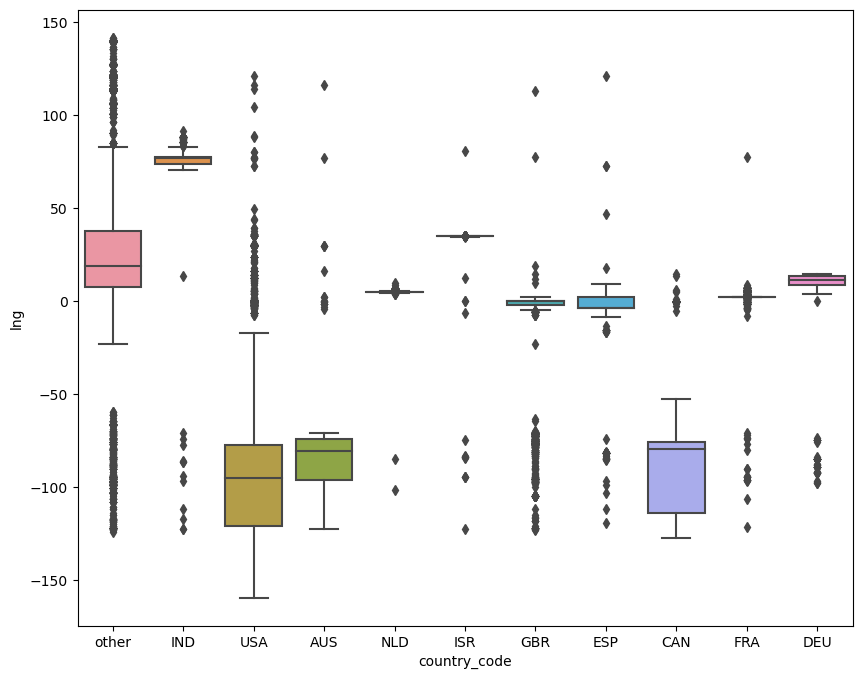

In [51]:
# Country code with numerical features
for col in num_feat:
    plt.figure(figsize = (10,8))
    sns.boxplot(data = df_company, x = "country_code", y = col)

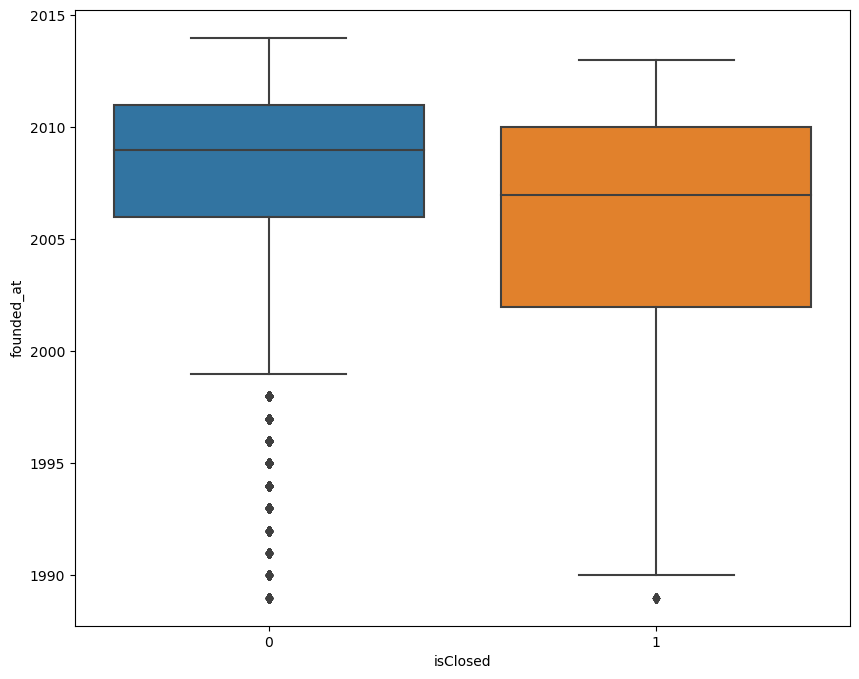

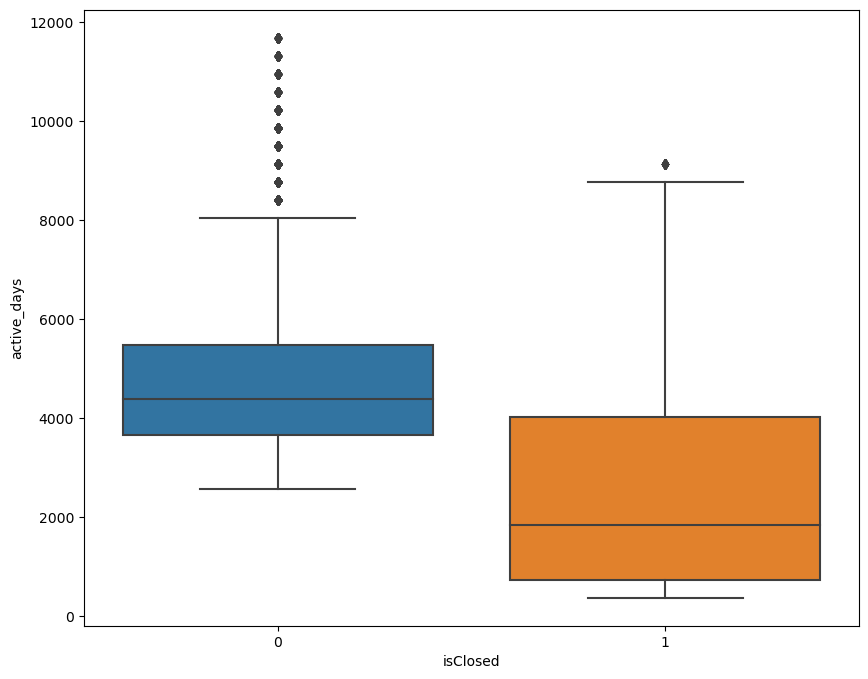

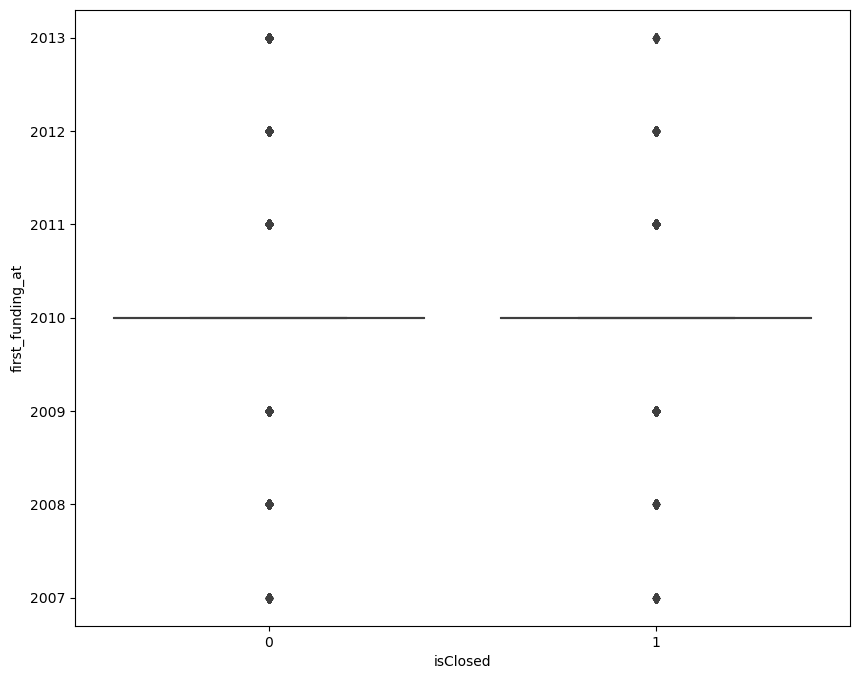

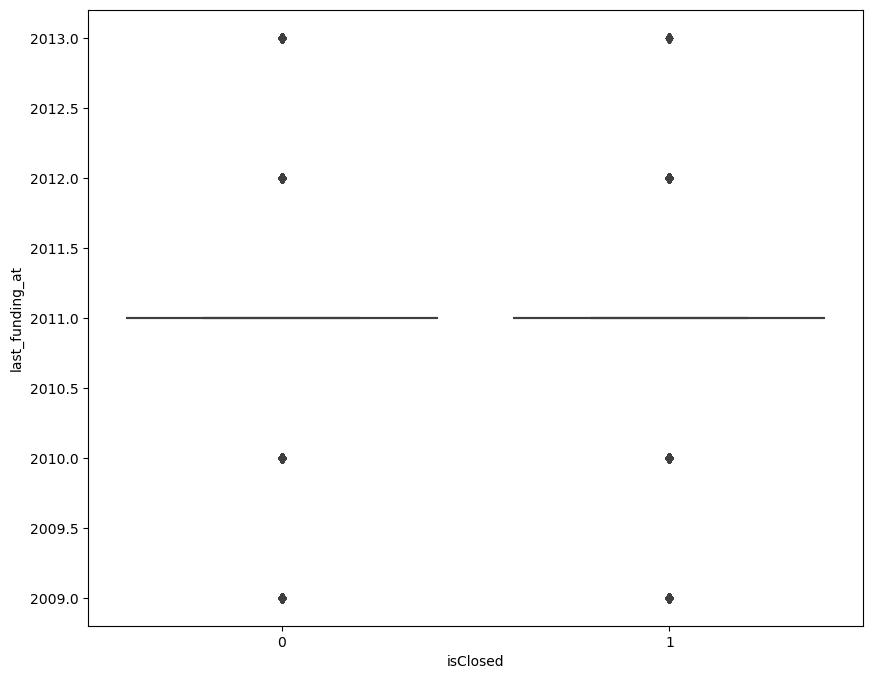

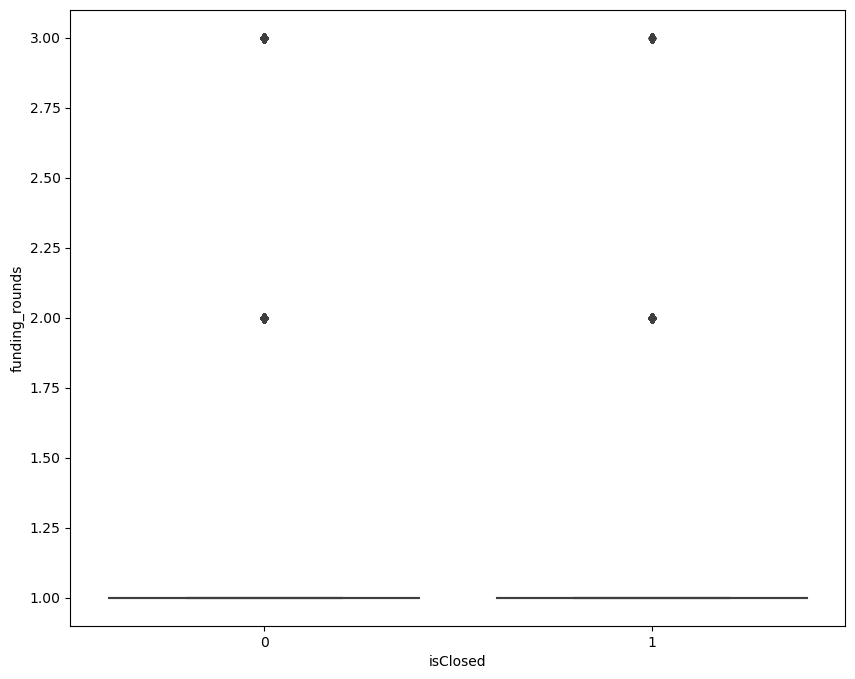

...

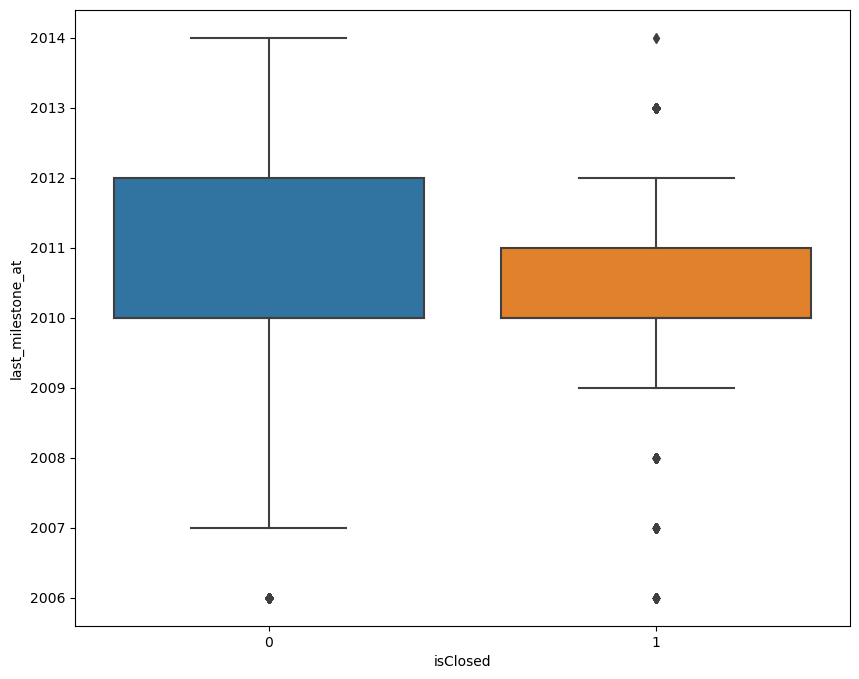

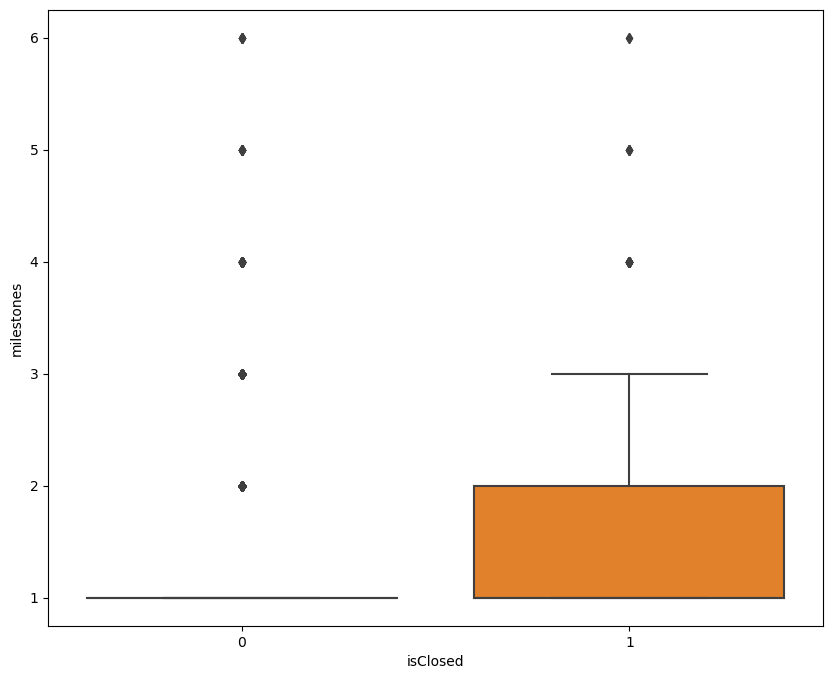

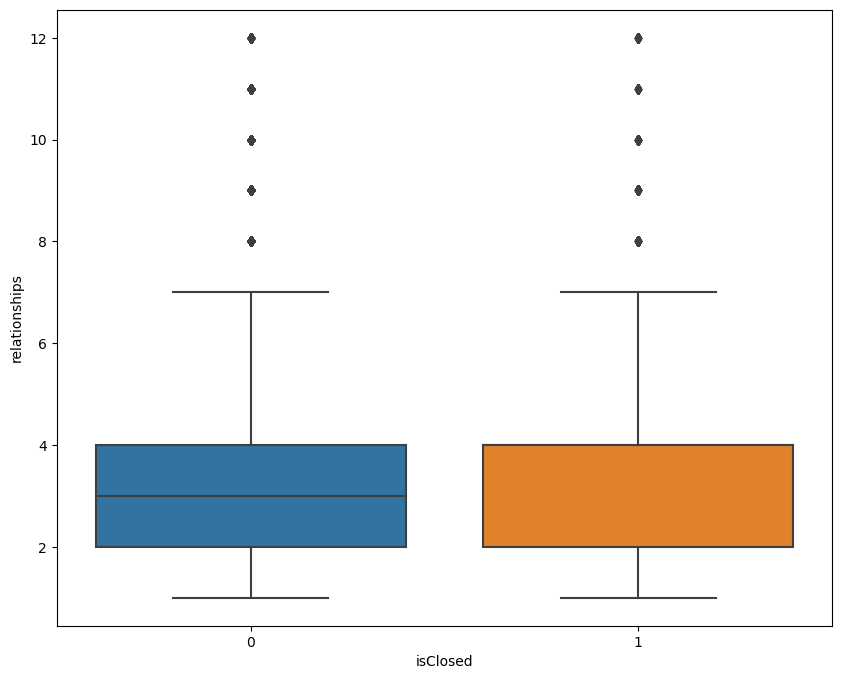

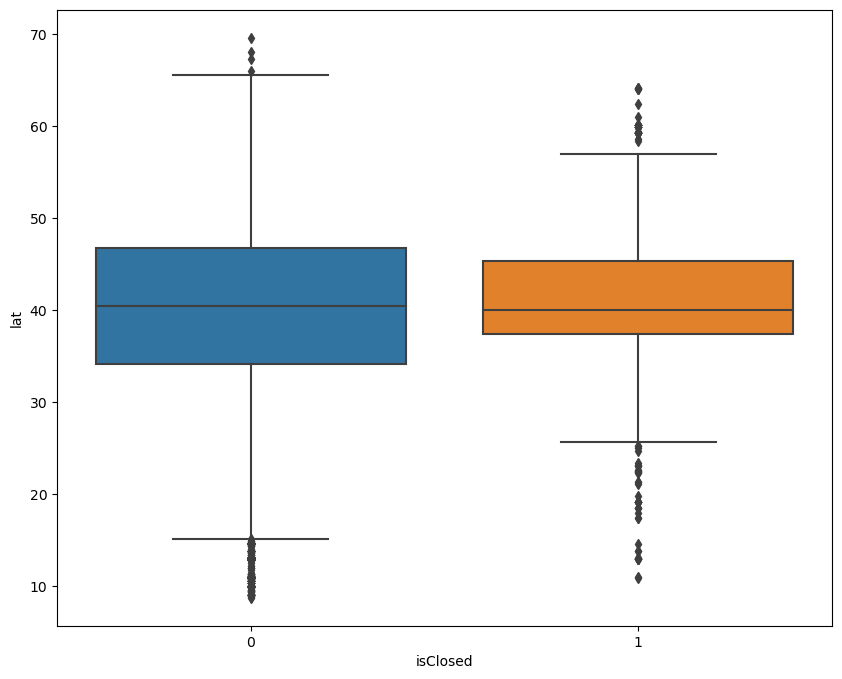

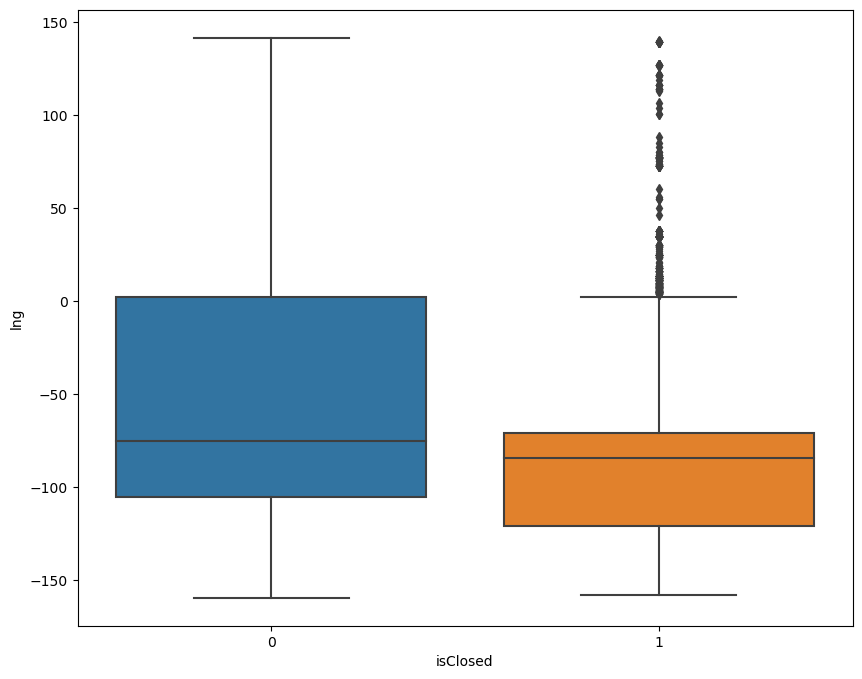

In [52]:
# Is closed with numerical features
for col in num_feat:
    plt.figure(figsize = (10,8))
    sns.boxplot(data = df_company, x = "isClosed", y = col)

## 3) Multivariate analysis/ PCA

In [54]:
# Standardisation of numerical features
scaler = StandardScaler().set_output(transform = "pandas")
scaled_feat = scaler.fit_transform(df_company[num_feat])
scaled_feat

,founded_at,active_days,first_funding_at,last_funding_at,funding_rounds,funding_total_usd,first_milestone_at,last_milestone_at,milestones,relationships,lat,lng
0,-0.162634,0.257041,-0.392961,-0.291683,-0.281152,0.400744,-0.553941,-0.393942,-0.352169,-0.603342,-1.027861,0.633597
1,0.047675,0.055264,-0.392961,-0.291683,-0.281152,0.400744,-0.553941,-0.393942,-0.352169,0.449181,-1.897130,1.881706
2,0.047675,0.055264,-0.392961,-0.291683,-0.281152,0.400744,-1.190471,-1.838912,-0.352169,-0.603342,-0.464888,-0.818970
4,0.047675,0.055264,-0.392961,-0.291683,-0.281152,0.400744,-1.190471,-1.838912,-0.352169,-0.077080,-0.744095,-0.979759
7,0.678599,-0.550620,-0.392961,-0.291683,-0.281152,0.400744,0.719117,0.328542,-0.352169,-0.603342,0.965605,-1.065739
...,...,...,...,...,...,...,...,...,...,...,...,...
57650,-0.372942,0.458818,-0.392961,-0.291683,-0.281152,0.400744,-0.553941,-0.393942,-0.352169,0.449181,-0.518561,1.281636
57651,0.047675,0.055264,-0.392961,-0.291683,-0.281152,0.400744,0.719117,0.328542,-0.352169,0.975443,-0.126706,-0.387278
57652,-0.793558,0.862925,-0.392961,-0.291683,-0.281152,0.400744,-0.553941,-0.393942,-0.352169,0.449181,0.076907,-0.342299
57653,-0.162634,0.257041,-0.392961,-0.291683,-0.281152,0.400744,1.992176,1.773511,1.921252,0.975443,-0.241382,-1.067472


In [55]:
# Dimentionality reduction with PCA to conserve 80% of variance
pca = PCA(n_components=0.8).set_output(transform = "pandas")
pca_components = pca.fit_transform(scaled_feat)
pca_components

,pca0,pca1,pca2,pca3,pca4,pca5,pca6
0,1.107051,-0.276895,-0.584378,-0.253610,0.910883,0.497403,0.192130
1,0.966918,-0.518913,-0.421374,-0.244730,1.746180,1.924828,-0.373239
2,1.706436,0.194228,-1.195730,1.046131,0.461806,-0.717608,0.140081
4,1.666094,0.284398,-0.941557,1.196176,0.794561,-0.735263,-0.042714
7,-0.435511,-1.106103,-0.158523,-0.119484,-0.848984,-1.351878,0.548755
...,...,...,...,...,...,...,...
57650,1.201162,-0.094963,-0.021846,-0.300127,0.421916,1.269545,-0.292047
57651,-0.037246,-0.517050,0.810689,-0.332387,0.271202,-0.335991,-0.077114
57652,1.401156,0.502760,0.469775,-0.108642,-0.032164,-0.267035,-0.072835
57653,-1.408599,-0.813532,2.919683,-0.613419,0.500555,-1.014340,-0.443962


In [60]:
# Displaying variance ratio explained by each component
pca.explained_variance_ratio_

array([0.25877782, 0.14343394, 0.13272156, 0.09121024, 0.08331658,
       0.08017355, 0.06804227])

In [59]:
# Displaying total of variance ratio explained by each component
np.sum(pca.explained_variance_ratio_)

0.8576759628889603

C:\Users\HP\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x1000 with 0 Axes>

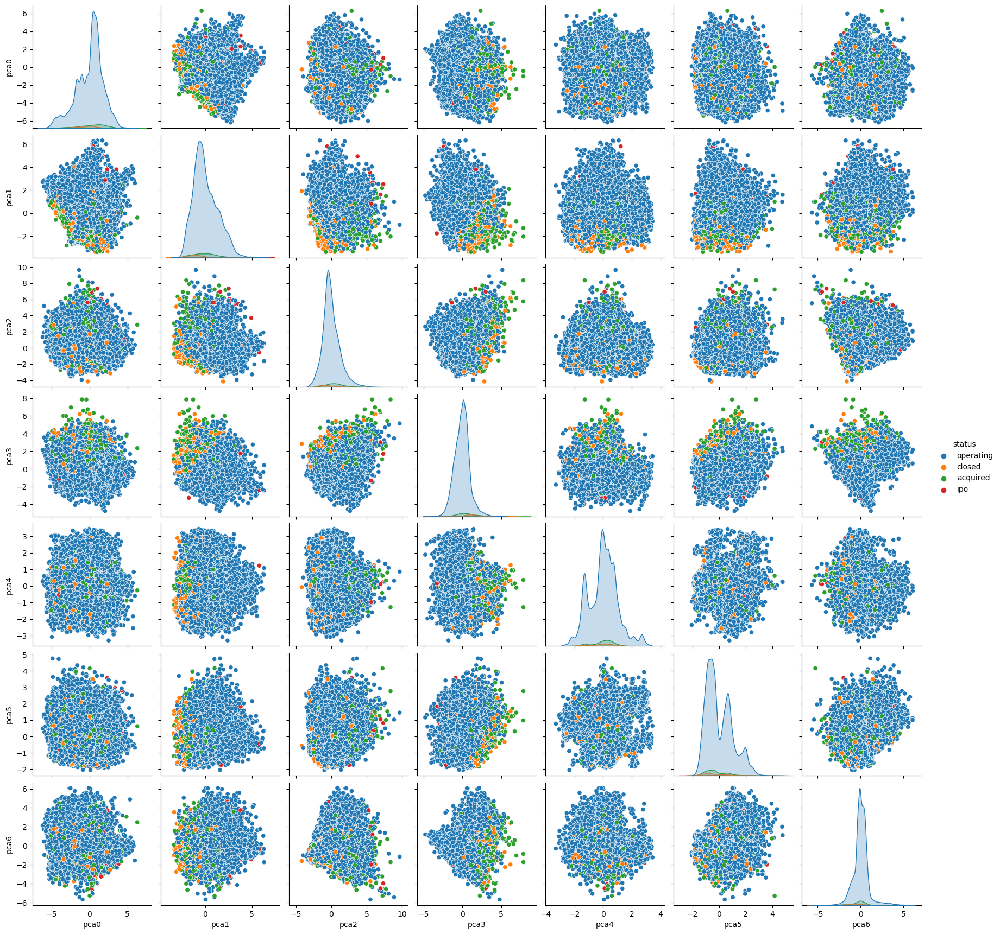

In [57]:
plt.figure(figsize = (12,10))
sns.pairplot(pd.concat([pca_components,df_company[["status"]]], axis = 1, ignore_index = False), hue = "status")

In [61]:
# Saving principal components
pca_components.to_csv("pca_components.csv", index = False)

In [62]:
#Finally Saving explored Data.
df_company.to_csv("company_explored_df.csv", index = False)